# Multi-hazard Earthquake Risk Analysis - Figure Generation

**Paper:** Multi-hazard scenario ensembles for estimating earthquake risk

**Purpose:** This notebook consolidates all figure generation code for the scientific paper in a single, organized location.

**Contents:**
- Figure 1: Study area map with administrative boundaries
- Figure 2: Exceedance probability plots
- Figure 3: District-wise impacts with landslide/shaking ratio
- Figure 4: District-wise exceedance by physiography
- Figure 5: Specificity analysis
- Figure 7 & 7: Worst-case and mean impact maps
- Figure 9: Fatality maps (District and Ward level)
- Figure 10: Risk analysis with remoteness
- **Figure 11: Multi-Hazard Risk Scores (Absolute and Normalized)**
- Supplementary Figures: Province-level and distribution analysis

## 1. Setup and Imports

In [1]:
import os
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.ticker as ticker
import seaborn as sns
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
from tqdm import tqdm
from mpl_toolkits.axes_grid1 import make_axes_locatable
from scipy import stats
import scienceplots

# Suppress warnings for cleaner output
import warnings
warnings.filterwarnings('ignore')

print("All libraries imported successfully!")

All libraries imported successfully!


### Configure plotting style

In [2]:
# Try to use scientific plotting style if available
try:
    plt.style.use(['science', 'no-latex', 'vibrant'])
    print("Using SciencePlots style")
except:
    # Custom scientific style settings if SciencePlots not installed
    plt.rcParams['axes.linewidth'] = 1.0
    plt.rcParams['axes.labelsize'] = 14
    plt.rcParams['axes.titlesize'] = 14
    plt.rcParams['xtick.labelsize'] = 12
    plt.rcParams['ytick.labelsize'] = 12
    plt.rcParams['legend.fontsize'] = 11
    plt.rcParams['legend.title_fontsize'] = 11
    plt.rcParams['grid.linewidth'] = 0.5
    plt.rcParams['lines.linewidth'] = 1.5
    plt.rcParams['lines.markersize'] = 5
    plt.rcParams['figure.dpi'] = 300
    print("Using custom scientific style")

Using SciencePlots style


### Set paths

In [3]:
# Set working directory and output paths
base_dir = os.path.expanduser("/mnt/CEPH_PROJECTS/Proslide/Alex/SajagN")
data_dir = os.path.expanduser("/mnt/CEPH_PROJECTS/Proslide/Alex/SajagN/data")
output_dir = os.path.join(base_dir, "figs")
output_dir = os.path.join("/mnt/CEPH_PROJECTS/Proslide/Alex/SajagN/Sajag-Nepal---HyperedgeMH-ensemble/FIGURES")

# Create output directory if it doesn't exist
os.makedirs(output_dir, exist_ok=True)

print(f"Base directory: {base_dir}")
print(f"Data directory: {data_dir}")
print(f"Output directory: {output_dir}")

Base directory: /mnt/CEPH_PROJECTS/Proslide/Alex/SajagN
Data directory: /mnt/CEPH_PROJECTS/Proslide/Alex/SajagN/data
Output directory: /mnt/CEPH_PROJECTS/Proslide/Alex/SajagN/Sajag-Nepal---HyperedgeMH-ensemble/FIGURES


## 2. Load Datasets

In [4]:
print("Loading datasets...")
stats_dir = os.path.join(data_dir, "aggregated_stats")

# Impact statistics
stats_buildings_lsimpact = pd.read_csv(os.path.join(stats_dir, "stats_buildings_lsimpact_2024-06-24_physiog.csv"))
stats_eqimpact = pd.read_csv(os.path.join(stats_dir, "stats_eqimpact_2024-06-24_physiog.csv"))
stats_roads_lsimpact = pd.read_csv(os.path.join(stats_dir, "stats_roads_lsimpact_2024-06-24_physiog.csv"))

print(f"Loaded building landslide impacts: {len(stats_buildings_lsimpact)} records")
print(f"Loaded earthquake impacts: {len(stats_eqimpact)} records")
print(f"Loaded road landslide impacts: {len(stats_roads_lsimpact)} records")

Loading datasets...
Loaded building landslide impacts: 2310 records
Loaded earthquake impacts: 2310 records
Loaded road landslide impacts: 2310 records


In [5]:
# Nepal administrative boundaries
nepal_admin = gpd.read_file(os.path.join(data_dir, "shp", "hermes_NPL_new_wgs", "hermes_NPL_new_wgs_2.shp"))
print(f"Original CRS: {nepal_admin.crs}")

# Transform to UTM 45N for better visualization
nepal_admin = nepal_admin.to_crs("EPSG:32645")
print(f"Transformed to CRS: {nepal_admin.crs}")
print(f"Loaded {len(nepal_admin)} administrative units")

Original CRS: EPSG:4326
Transformed to CRS: EPSG:32645
Loaded 77 administrative units


In [6]:
# Load asset counts (buildings and roads per district)
asset_counts_file = os.path.join(stats_dir, "district_asset_counts.csv")

if os.path.exists(asset_counts_file):
    asset_counts = pd.read_csv(asset_counts_file)
    print(f"Loaded asset counts from: {asset_counts_file}")
    print(f"Number of districts: {len(asset_counts)}")
    print(f"Total buildings: {asset_counts['BuildingCount'].sum():,.0f}")
    print(f"Total road segments: {asset_counts['RoadSegmentCount'].sum():,.0f}")
else:
    print(f"WARNING: Asset counts file not found. Creating placeholder.")
    asset_counts = pd.DataFrame({
        'District': nepal_admin['DISTRICT'].unique(),
        'BuildingCount': np.nan,
        'RoadSegmentCount': np.nan
    })

Loaded asset counts from: /mnt/CEPH_PROJECTS/Proslide/Alex/SajagN/data/aggregated_stats/district_asset_counts.csv
Number of districts: 78
Total buildings: 7,076,633
Total road segments: 3,210,873


In [7]:
# Social vulnerability metrics (remoteness data)
nepal_remoteness = pd.read_csv(os.path.join(data_dir, "Remotenessdata", "Remoteness_DFID_Data.csv"))
municipalities_df = pd.read_csv(os.path.join(data_dir, "Remotenessdata", "Remoteness_DFID_Municipalities.csv"))

print(f"Loaded remoteness data: {len(nepal_remoteness)} records")
print(f"Loaded municipalities data: {len(municipalities_df)} records")

Loaded remoteness data: 102960 records
Loaded municipalities data: 753 records


## 3. Helper Functions

In [8]:
def create_map(data, column, ax, title, cmap, transform='log', legend_title='Impacts',
              highlight_nodata=False, nodata_condition=None, vmin=None, vmax=None, add_basemap=True):
    """
    Create a map with contextily basemap and properly positioned colorbar.
    
    Parameters:
    -----------
    data : GeoDataFrame
        The data to plot
    column : str
        The column to use for coloring
    ax : matplotlib.axes.Axes
        The axes to plot on
    title : str
        The title for the plot
    cmap : str
        The colormap to use
    transform : str
        'log' for logarithmic scale, 'identity' for linear scale
    legend_title : str
        Title for the colorbar
    vmin, vmax : float or None
        Manual color scale limits
    add_basemap : bool
        Whether to add contextily basemap
    """
    # Convert to Web Mercator for contextily
    plot_data = data.to_crs("EPSG:3857") if add_basemap else data.copy()
    
    valid_data = plot_data[column].dropna()
    norm = None

    vmin_calc = vmin if vmin is not None else (valid_data.min() if len(valid_data) > 0 else 0)
    vmax_calc = vmax if vmax is not None else (valid_data.max() if len(valid_data) > 0 else 1)

    if transform == 'log':
        positive_values = valid_data[valid_data > 0]
        if len(positive_values) > 0:
            log_vmin = vmin_calc if vmin_calc > 0 else positive_values.min()
            log_vmax = vmax_calc
            if np.isclose(log_vmin, log_vmax):
                log_vmax = log_vmin * 1.1 + 0.1
            norm = colors.LogNorm(vmin=log_vmin, vmax=log_vmax)
        else:
            norm = colors.Normalize(vmin=vmin_calc, vmax=vmax_calc)
    else:
        if np.isclose(vmin_calc, vmax_calc):
            vmax_calc = vmin_calc + 1
        norm = colors.Normalize(vmin=vmin_calc, vmax=vmax_calc)

    # Plot the data with transparency
    plot_data.plot(
        column=column, ax=ax, cmap=cmap, norm=norm, legend=False,
        edgecolor='gray', linewidth=0.3, alpha=0.6,
        missing_kwds={"color": "lightgray", "edgecolor": "red", "hatch": "////", "alpha": 0.3}
    )
    
    # Add contextily basemap
    if add_basemap:
        try:
            import contextily as ctx
            ctx.add_basemap(ax, crs=plot_data.crs, 
                           source=ctx.providers.OpenTopoMap, 
                           alpha=0.5, attribution=False, zoom=8)
        except Exception as e:
            print(f"Could not add basemap: {e}")
            ax.set_facecolor('lightgray')
    
    # Add colorbar
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="3%", pad=0.1)
    
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm._A = []
    cbar = plt.colorbar(sm, cax=cax)
    cbar.set_label(legend_title, fontsize=14)
    cbar.ax.tick_params(labelsize=12)

    if transform == 'log':
        cbar.ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f'{x:,.0f}'))
    elif 'Percent' in legend_title or '%' in legend_title:
        cbar.ax.yaxis.set_major_formatter(ticker.PercentFormatter(xmax=100, decimals=0))
    else:
        cbar.ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f'{x:.2f}'))

    # Add coordinate labels
    import matplotlib.ticker as mticker
    
    def format_lon(x, pos):
        lon = x / 20037508.34 * 180
        return f'{lon:.1f}E'
    
    def format_lat(y, pos):
        lat = (2 * np.arctan(np.exp(y / 20037508.34 * 180 * np.pi / 180)) - np.pi / 2) * 180 / np.pi
        return f'{lat:.1f}N'
    
    if add_basemap:
        ax.xaxis.set_major_formatter(mticker.FuncFormatter(format_lon))
        ax.yaxis.set_major_formatter(mticker.FuncFormatter(format_lat))
        ax.tick_params(axis='both', labelsize=10)
    else:
        ax.set_xticks([])
        ax.set_yticks([])
    
    ax.set_title(title, fontsize=14, pad=10)
    ax.set_aspect('equal', adjustable='box')
    
    return ax

print("Helper function 'create_map' updated with contextily support")

Helper function 'create_map' updated with contextily support


In [9]:
def calculate_exceedance(data, impact_type):
    """
    Calculate exceedance probability for a given impact type.
    """
    sorted_impacts = np.sort(data[impact_type].values)[::-1]
    exceedance_prob = np.arange(1, len(sorted_impacts) + 1) / len(sorted_impacts)
    return pd.DataFrame({
        'Impact': sorted_impacts, 
        'Probability': exceedance_prob, 
        'HazardType': impact_type
    })

print("Helper function 'calculate_exceedance' defined successfully")

Helper function 'calculate_exceedance' defined successfully


## 4. Prepare Impact Data

In [10]:
# Combine all impact types into one dataframe
impact_data = pd.DataFrame({
    'District': stats_eqimpact['DISTRICT'],
    'Event': stats_eqimpact['event'],
    'Earthquake': stats_eqimpact['collapse_mid_sum'],
    'BuildingLandslide': stats_buildings_lsimpact['impact_sum'],
    'RoadLandslide': stats_roads_lsimpact['impact_sum']
})

# Aggregate impacts across all districts for each scenario
aggregate_impacts = impact_data.groupby('Event').agg(
    Earthquake=('Earthquake', 'sum'),
    BuildingLandslide=('BuildingLandslide', 'sum'),
    RoadLandslide=('RoadLandslide', 'sum')
).reset_index()

# Define consistent colors and labels
colors_dict = {
    'Earthquake': '#9e9e9e',
    'BuildingLandslide': '#7474ee',
    'RoadLandslide': '#3700ff'
}

labels_dict = {
    'Earthquake': 'Buildings damaged by shaking',
    'BuildingLandslide': 'Buildings damaged by landslides',
    'RoadLandslide': 'Roads damaged by landslides'
}

print(f"Prepared impact data for {len(impact_data['District'].unique())} districts")
print(f"Total scenarios: {len(impact_data['Event'].unique())}")

Prepared impact data for 77 districts
Total scenarios: 30


# MAIN FIGURES

## Figure 1: Study Area Map

Creating Figure 1: Study area map with administrative boundaries...
Loaded 77 districts
Converted to EPSG:3857
✓ District boundaries plotted with 50% transparent white fill
✓ Basemap added
✓ Ward boundaries plotted
✓ DMG fault lines plotted (thickened)
✓ Added labels for all 77 districts
✓ Scale bar added (100 km)
✓ Figure saved to: /mnt/CEPH_PROJECTS/Proslide/Alex/SajagN/Sajag-Nepal---HyperedgeMH-ensemble/FIGURES/Fig1_study_area_map.png


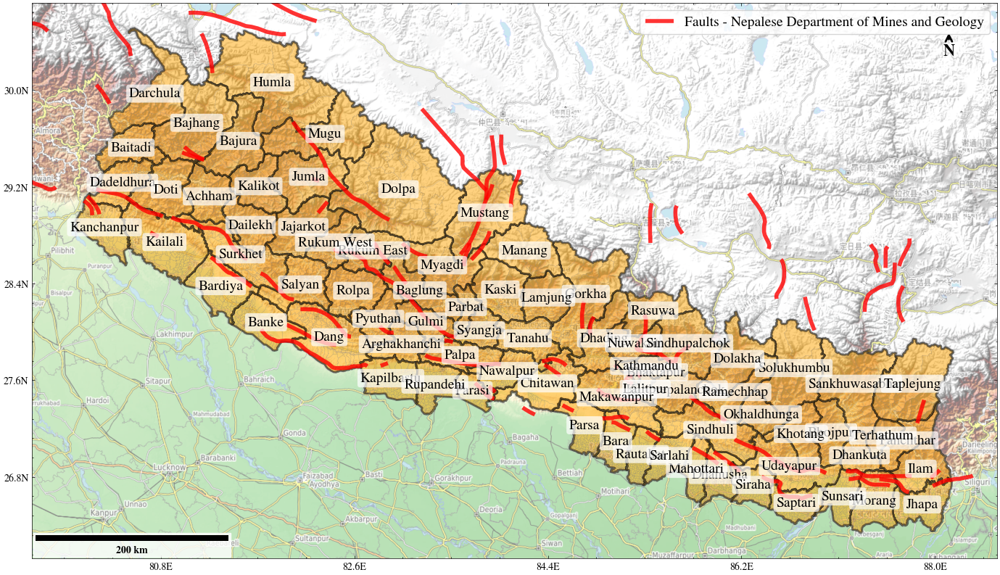

✓ Figure 1 complete


In [11]:
print("Creating Figure 1: Study area map with administrative boundaries...")

import contextily as ctx
from matplotlib_scalebar.scalebar import ScaleBar

# Define district file path
district_file = os.path.join(data_dir, "shp", "hermes_NPL_new_wgs", "hermes_NPL_new_wgs_2.shp")

# Load district data in WGS84
districts = gpd.read_file(district_file)
print(f"Loaded {len(districts)} districts")

# Create figure
fig1, ax1 = plt.subplots(1, 1, figsize=(14, 10))

# Convert to Web Mercator for contextily
districts_mercator = districts.to_crs("EPSG:3857")
print(f"Converted to EPSG:3857")

# Plot districts with transparent white fill (50% transparency) FIRST to set axis limits
districts_mercator.plot(ax=ax1, facecolor='orange', edgecolor='black', linewidth=2.0, alpha=0.5)
print("✓ District boundaries plotted with 50% transparent white fill")

# Add contextily basemap AFTER plotting to preserve axis limits
try:
    ctx.add_basemap(ax1, crs=districts_mercator.crs, 
                   source=ctx.providers.OpenTopoMap, 
                   alpha=0.5, attribution=False, zoom=8)
    print("✓ Basemap added")
except Exception as e:
    print(f"Could not add basemap: {e}")

# Load and plot ward boundaries if available
ward_file = os.path.join(data_dir, "shp", "Ward", "NP_Ward_P21_Wgs84.shp")
if os.path.exists(ward_file):
    try:
        wards = gpd.read_file(ward_file)
        wards_mercator = wards.to_crs("EPSG:3857")
        wards_mercator.plot(ax=ax1, facecolor='none', edgecolor='gray', linewidth=0.15, alpha=0.5)
        print("✓ Ward boundaries plotted")
    except Exception as e:
        print(f"Could not plot ward boundaries: {e}")

# Load and plot faults with thickened lines
fault_file = os.path.join(base_dir, "figs", "GMT", "Nepal_Faults_DMG.shp")
fault_gmt_file = os.path.join(base_dir, "figs", "GMT", "HimaTibetMap.geojson")

if os.path.exists(fault_file):
    try:
        faults = gpd.read_file(fault_file)
        faults_mercator = faults.to_crs("EPSG:3857")
        faults_mercator.plot(ax=ax1, edgecolor='red', linewidth=4.0, alpha=0.8, label='Faults - Nepalese Department of Mines and Geology')
        print("✓ DMG fault lines plotted (thickened)")
    except Exception as e:
        print(f"Could not plot DMG faults: {e}")

# if os.path.exists(fault_gmt_file):
#     try:
#         main_faults = gpd.read_file(fault_gmt_file)
#         main_faults_mercator = main_faults.to_crs("EPSG:3857")
#         main_faults_mercator.plot(ax=ax1, edgecolor='red', linewidth=4.0, alpha=0.8, label='HimaTibetMap Faults')
#         print("✓ HimaTibetMap fault lines plotted (thickened)")
#     except Exception as e:
#         print(f"Could not plot HimaTibetMap faults: {e}")

# Add ALL district labels (not just major ones)
for idx, row in districts_mercator.iterrows():
    dist_name = row['DISTRICT']
    centroid = row.geometry.centroid
    ax1.annotate(dist_name.title(), xy=(centroid.x, centroid.y),
                fontsize=14, fontweight='normal', color='black',
                ha='center', va='center',
                bbox=dict(boxstyle='round,pad=0.2', facecolor='white', alpha=0.7, edgecolor='none'))

print(f"✓ Added labels for all {len(districts)} districts")

# Add coordinate labels with Unicode degree symbols
import matplotlib.ticker as mticker

def format_lon(x, pos):
    lon = x / 20037508.34 * 180
    return f'{lon:.1f}E'

def format_lat(y, pos):
    lat = (2 * np.arctan(np.exp(y / 20037508.34 * 180 * np.pi / 180)) - np.pi / 2) * 180 / np.pi
    return f'{lat:.1f}N'

ax1.xaxis.set_major_formatter(mticker.FuncFormatter(format_lon))
ax1.yaxis.set_major_formatter(mticker.FuncFormatter(format_lat))
ax1.tick_params(axis='both', labelsize=10)

# Set aspect ratio
ax1.set_aspect('equal', adjustable='box')

# # Add title
# ax1.set_title('Study Area: Nepal Administrative Districts', fontsize=14, pad=15)

# Add scale bar (100 km)
# Web Mercator uses meters, so 1 unit = 1 meter
scalebar = ScaleBar(
    dx=1,  # 1 pixel = 1 meter in Web Mercator
    units='m',
    length_fraction=0.25,
    location='lower left',
    box_alpha=0.8,
    color='black',
    font_properties={'size': 10, 'weight': 'bold'}
)
ax1.add_artist(scalebar)
print("✓ Scale bar added (100 km)")

# Add north arrow
arrow_x = 0.95
arrow_y = 0.95
ax1.annotate('N', xy=(arrow_x, arrow_y), xytext=(arrow_x, arrow_y - 0.05),
            xycoords='axes fraction', fontsize=16, fontweight='bold',
            ha='center', va='bottom',
            arrowprops=dict(arrowstyle='->', lw=2, color='black'))

# Add legend
ax1.legend(loc='upper right', frameon=True, facecolor='white', framealpha=0.8, fontsize=14)

# Save figure
output_path = os.path.join(output_dir, "Fig1_study_area_map.png")
fig1.tight_layout()
fig1.savefig(output_path, dpi=300, bbox_inches='tight')
print(f"✓ Figure saved to: {output_path}")

# output_pdf = os.path.join(output_dir, "Fig1_study_area_map.pdf")
# fig1.savefig(output_pdf, bbox_inches='tight')

plt.show()
print("✓ Figure 1 complete")

## Figure 2: Exceedance Probability Plots

Creating Figure 2: Exceedance probability plots...
✓ Figure 2 saved


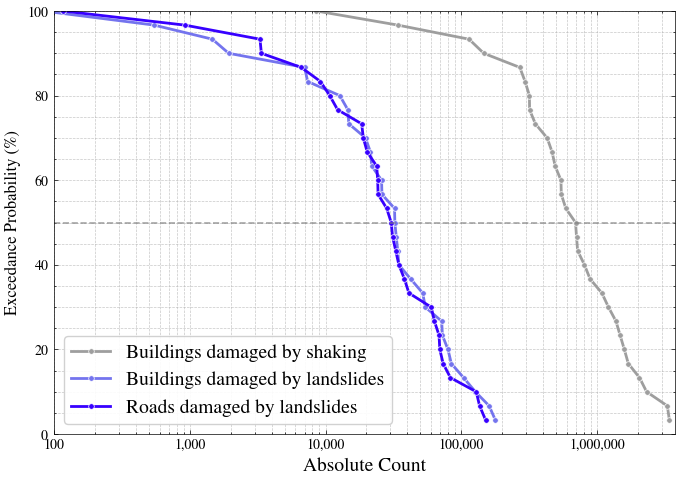

In [ ]:
print("Creating Figure 2: Exceedance probability plots...")

# Calculate exceedance probabilities for each hazard type
exceedance_dfs = [calculate_exceedance(aggregate_impacts, itype)
                  for itype in ['Earthquake', 'BuildingLandslide', 'RoadLandslide']]
exceedance_data = pd.concat(exceedance_dfs, ignore_index=True)

# Create the plot
fig2, ax = plt.subplots(figsize=(7, 5))

for hazard_type in ['Earthquake', 'BuildingLandslide', 'RoadLandslide']:
    hazard_data = exceedance_data[exceedance_data['HazardType'] == hazard_type]
    ax.plot(hazard_data['Impact'], hazard_data['Probability'] * 100,
            color=colors_dict[hazard_type], label=labels_dict[hazard_type],
            marker='o', markersize=4, linewidth=2,
            markeredgecolor='white', markeredgewidth=0.5)

ax.set_xscale('log')
ax.set_xlim(100, exceedance_data['Impact'].max() * 1.1)
ax.set_ylim(0, 100)
ax.grid(True, which="both", linestyle='--', linewidth=0.5, alpha=0.7)
# Add dashed line at 50% to show median impacts
ax.axhline(y=50, color='gray', linestyle='--', linewidth=1.2, alpha=0.7)
ax.set_xlabel('Absolute Count', fontsize=14, fontweight='bold')
ax.set_ylabel('Exceedance Probability (%)', fontsize=14, fontweight='bold')
ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f'{x:,.0f}'))
ax.legend(frameon=True, fancybox=True, framealpha=0.9, loc='lower left', fontsize=14)

fig2.tight_layout()
fig2.savefig(os.path.join(output_dir, "Fig2_exceedance_probability.png"), dpi=300, bbox_inches='tight')
# fig2.savefig(os.path.join(output_dir, "Fig2_exceedance_probability.pdf"), bbox_inches='tight')
print("✓ Figure 2 saved")
plt.show()

## Figure 3: District-wise Impacts with Landslide/Shaking Ratio

Creating Figure 3: District-wise impact bar plots with ratio map...
✓ Contextily basemap added
✓ Figure 3 (combined A+B) saved


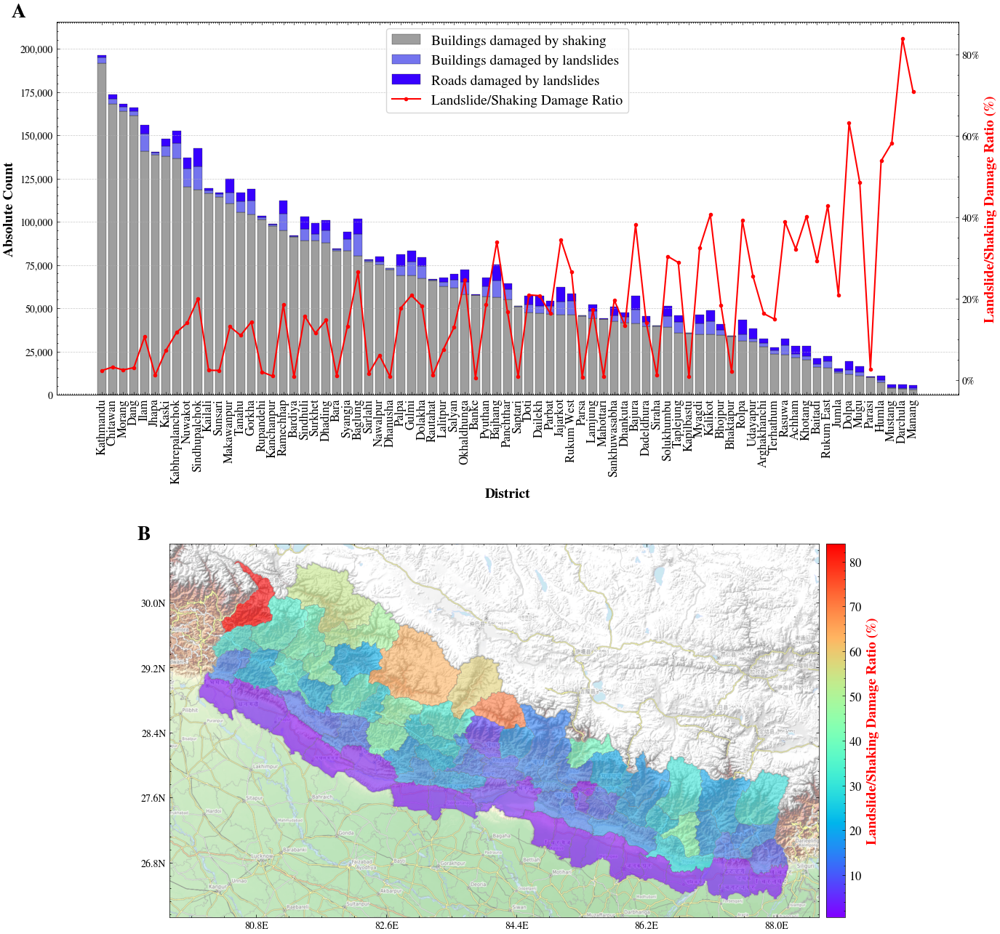


✓ Figure 3 complete: Combined figure with Panel A (bar) + Panel B (map)


In [37]:
print("Creating Figure 3: District-wise impact bar plots with ratio map...")

# Calculate maximum impacts by district
impact_max_by_district = impact_data.groupby('District').agg(
    Earthquake=('Earthquake', 'max'),
    BuildingLandslide=('BuildingLandslide', 'max'),
    RoadLandslide=('RoadLandslide', 'max')
).reset_index()

# Calculate landslide to shaking ratio
impact_max_by_district['LandslideRatio'] = (
    (impact_max_by_district['BuildingLandslide'] + impact_max_by_district['RoadLandslide']) / 
    impact_max_by_district['Earthquake'] * 100
)

# Sort by earthquake impacts for visualization
impact_max_by_district = impact_max_by_district.sort_values('Earthquake', ascending=False)

# =============================================================================
# Create combined figure with both panels
# =============================================================================
fig3 = plt.figure(figsize=(16, 16))
gs = fig3.add_gridspec(2, 1, height_ratios=[1, 1], hspace=0.4)  # Reduced spacing between panels

# =============================================================================
# PANEL A: Bar chart
# =============================================================================
ax1 = fig3.add_subplot(gs[0, :])

# Stacked bar plot
districts = impact_max_by_district['District'].tolist()
bottoms = np.zeros(len(districts))

for hazard in ['Earthquake', 'BuildingLandslide', 'RoadLandslide']:
    impact_values = impact_max_by_district.set_index('District').loc[districts][hazard].values
    ax1.bar(np.arange(len(districts)), impact_values, bottom=bottoms,
            label=labels_dict[hazard], color=colors_dict[hazard],
            edgecolor='black', linewidth=0.2)
    bottoms += impact_values

# Add ratio line on secondary axis
ax2 = ax1.twinx()
ax2.plot(np.arange(len(districts)), impact_max_by_district['LandslideRatio'],
         color='red', linewidth=1.5, marker='o', markersize=3)

ax1.set_xticks(np.arange(len(districts)))
ax1.set_xticklabels(districts, rotation=90, fontsize=12)
ax1.set_xlabel('District', fontsize=14, fontweight='bold')
ax1.set_ylabel('Absolute Count', fontsize=14, fontweight='bold')
ax2.set_ylabel('Landslide/Shaking Damage Ratio (%)', fontsize=14, fontweight='bold', color='red')

# Add "A" label
ax1.text(-0.05, 1.05, 'A', transform=ax1.transAxes, fontsize=20, fontweight='bold', va='top')

ax1.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f'{x:,.0f}'))
ax2.yaxis.set_major_formatter(ticker.PercentFormatter(decimals=0))
ax1.grid(True, axis='y', linestyle='--', linewidth=0.5, alpha=0.7)

# Add some margin at the top to prevent clipping
ax1.margins(y=0.1)

# Combined legend
handles1, labels1 = ax1.get_legend_handles_labels()
handles1.append(Line2D([0], [0], color='red', lw=1.5, marker='o', markersize=3))
labels1.append('Landslide/Shaking Damage Ratio')
ax1.legend(handles1, labels1, loc='upper center', frameon=True, fontsize=14)

# =============================================================================
# PANEL B: Map with geopandas and contextily
# =============================================================================
ax3 = fig3.add_subplot(gs[1, :])

# Merge ratio data with admin boundaries
nepal_admin_with_ratios = nepal_admin.merge(
    impact_max_by_district, left_on='DISTRICT', right_on='District', how='left'
)

# Add basemap with contextily (need to use Web Mercator for contextily)
try:
    import contextily as ctx
    # Convert to Web Mercator for basemap
    nepal_admin_ratios_mercator = nepal_admin_with_ratios.to_crs("EPSG:3857")
    
    # Plot in Web Mercator with INCREASED transparency
    nepal_admin_ratios_mercator.plot(
        column='LandslideRatio',
        ax=ax3,
        cmap='rainbow',
        edgecolor='gray',
        linewidth=0.3,
        alpha=0.6,  # Increased transparency from 0.75 to 0.6
        legend=False,
        missing_kwds={'color': 'lightgray', 'edgecolor': 'red', 'hatch': '////', 'alpha': 0.3}
    )
    
    ctx.add_basemap(ax3, crs=nepal_admin_ratios_mercator.crs, 
                   source=ctx.providers.OpenTopoMap, 
                   alpha=0.5, attribution=False, zoom=8)
    print("✓ Contextily basemap added")
    
    # Add axis labels with lat/lon conversion
    import matplotlib.ticker as mticker
    
    # Convert tick positions from Web Mercator to lat/lon for labels
    def format_lon(x, pos):
        lon = x / 20037508.34 * 180
        return f'{lon:.1f}E'
    
    def format_lat(y, pos):
        lat = (2 * np.arctan(np.exp(y / 20037508.34 * 180 * np.pi / 180)) - np.pi / 2) * 180 / np.pi
        return f'{lat:.1f}N'
    
    ax3.xaxis.set_major_formatter(mticker.FuncFormatter(format_lon))
    ax3.yaxis.set_major_formatter(mticker.FuncFormatter(format_lat))
    ax3.tick_params(axis='both', labelsize=10)
    
except Exception as e:
    print(f"Could not add contextily basemap: {e}")
    import traceback
    traceback.print_exc()
    # Fallback: use WGS84 with simple background
    nepal_admin_ratios_wgs84 = nepal_admin_with_ratios.to_crs("EPSG:4326")
    nepal_admin_ratios_wgs84.plot(
        column='LandslideRatio',
        ax=ax3,
        cmap='rainbow',
        edgecolor='gray',
        linewidth=0.3,
        alpha=0.6,
        legend=False,
        missing_kwds={'color': 'lightgray', 'edgecolor': 'red', 'hatch': '////', 'alpha': 0.3}
    )
    ax3.set_facecolor('lightgray')
    ax3.tick_params(axis='both', labelsize=10)
    ax3.xaxis.set_major_formatter(mticker.FuncFormatter(lambda x, p: f'{x:.1f}E'))
    ax3.yaxis.set_major_formatter(mticker.FuncFormatter(lambda y, p: f'{y:.1f}N'))

# Use adjustable='box-forced' for better alignment
ax3.set_aspect('equal', adjustable='box')

# Add colorbar with matching position to ax2
divider = make_axes_locatable(ax3)
cax = divider.append_axes("right", size="3%", pad=0.1)

# Create scalar mappable for colorbar
vmin = nepal_admin_with_ratios['LandslideRatio'].dropna().min()
vmax = nepal_admin_with_ratios['LandslideRatio'].dropna().max()
norm = colors.Normalize(vmin=vmin, vmax=vmax)
sm = plt.cm.ScalarMappable(cmap='rainbow', norm=norm)
sm.set_array([])

cbar = plt.colorbar(sm, cax=cax)
cbar.set_label('Landslide/Shaking Damage Ratio (%)', fontsize=14, fontweight='bold', color='red')
cbar.ax.tick_params(labelsize=12)

# Add "B" label matching style of "A"
ax3.text(-0.05, 1.05, 'B', transform=ax3.transAxes, fontsize=20, fontweight='bold', va='top')

# Save combined figure with more padding
fig3.tight_layout(pad=2.0)
fig3.savefig(os.path.join(output_dir, "Fig3_district_impacts_ratio.png"), dpi=300, bbox_inches='tight')
# fig3.savefig(os.path.join(output_dir, "Fig3_district_impacts_ratio.pdf"), bbox_inches='tight')
print("✓ Figure 3 (combined A+B) saved")
plt.show()

print("\n✓ Figure 3 complete: Combined figure with Panel A (bar) + Panel B (map)")

## Figure 4: District-wise Exceedance by Physiography

Creating Figure 4: District-wise exceedance probability plots...


Processing districts: 100%|██████████| 77/77 [00:00<00:00, 1061.90it/s]


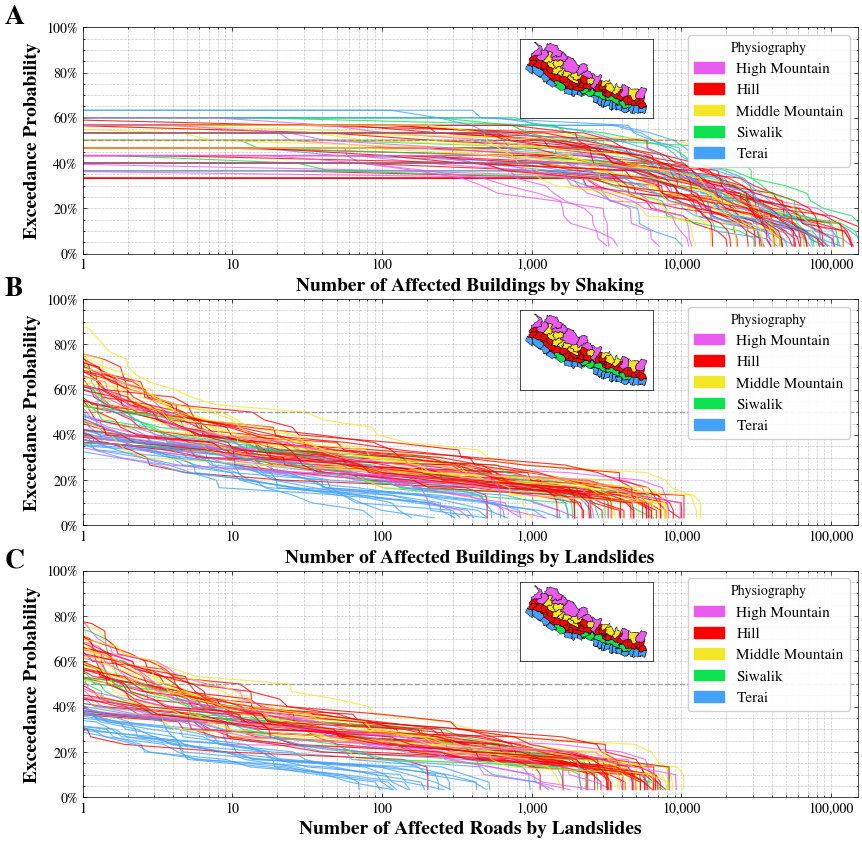


✓ Figure 4 complete: District-wise exceedance probability plots with inset map


In [14]:
#%% ===============================================================================
# FIGURE 4: District-wise exceedance probability plots
# ===============================================================================

print("Creating Figure 4: District-wise exceedance probability plots...")

# -------------------------------------------------------------------------------
# Compute exceedance probability by district
# -------------------------------------------------------------------------------
exceedance_data_by_district = []
for district in tqdm(impact_data['District'].unique(), desc="Processing districts"):
    for impact_type in ['Earthquake', 'BuildingLandslide', 'RoadLandslide']:
        district_impacts = impact_data[impact_data['District'] == district]
        sorted_impacts = np.sort(district_impacts[impact_type].values)[::-1]
        exceedance_prob = np.arange(1, len(sorted_impacts) + 1) / len(sorted_impacts)
        for impact, prob in zip(sorted_impacts, exceedance_prob):
            exceedance_data_by_district.append({
                'District': district,
                'ImpactType': impact_type,
                'Count': impact,
                'ExceedanceProb': prob
            })

exceedance_data_by_district = pd.DataFrame(exceedance_data_by_district)

# Map physiography to districts
district_physiography = {
    row['DISTRICT']: row['Physiography'] for _, row in stats_eqimpact.iterrows()
}
exceedance_data_by_district['Physiography'] = exceedance_data_by_district['District'].map(district_physiography)

# Normalize physiography naming and verify Terai
exceedance_data_by_district['Physiography'] = exceedance_data_by_district['Physiography'].replace('Tarai', 'Terai')
# Ensure all districts have a physiography (debugging step)
if exceedance_data_by_district['Physiography'].isna().any():
    print("Warning: Some districts lack physiography data. Filling with 'Unknown' for debugging.")
    exceedance_data_by_district['Physiography'] = exceedance_data_by_district['Physiography'].fillna('Unknown')

# -------------------------------------------------------------------------------
# Plot function
# -------------------------------------------------------------------------------
def plot_exceedance_by_physiography(data, impact_type, ax, label, add_inset=False):
    physiography_colors = {
        'High Mountain': '#e95aee',
        'Hill': 'red',
        'Middle Mountain': '#f5e727',
        'Siwalik': '#0fe24f',
        'Terai': '#44a2fa',
        'Unknown': 'gray'  # Default for unmapped regions
    }
    
    impact_data = data[data['ImpactType'] == impact_type]
    
    for district in impact_data['District'].unique():
        district_data = impact_data[impact_data['District'] == district]
        if not district_data.empty:
            physiography = district_data['Physiography'].iloc[0]
            ax.plot(
                district_data['Count'],
                district_data['ExceedanceProb'],
                color=physiography_colors.get(physiography, 'gray'),
                alpha=0.8,
                linewidth=0.8
            )
    
    ax.set_xscale('log')
    ax.set_xlim(1, 150000)
    ax.set_ylim(0, 1)
    if impact_type == 'Earthquake':
        xlabel_text = 'Number of Affected Buildings by Shaking'
    elif impact_type == 'BuildingLandslide':
        xlabel_text = 'Number of Affected Buildings by Landslides'
    elif impact_type == 'RoadLandslide':
        xlabel_text = 'Number of Affected Roads by Landslides'
    else:
        xlabel_text = 'Number of Impacts'
    ax.set_xlabel(xlabel_text, fontsize=14, fontweight='bold')
    ax.set_ylabel('Exceedance Probability', fontsize=14, fontweight='bold')
    ax.grid(True, which="both", linestyle='--', linewidth=0.5, alpha=0.7)
    ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f'{x:,.0f}'))
    ax.yaxis.set_major_formatter(ticker.PercentFormatter(xmax=1, decimals=0))
    ax.axhline(y=0.5, linestyle='--', color='gray', alpha=0.7)
    
    ax.text(
        -0.1, 1.1, label,
        transform=ax.transAxes, fontsize=20, fontweight='bold', va='top'
    )
    
    handles = [
        Patch(color=c, label=p)
        for p, c in physiography_colors.items()
        if p in impact_data['Physiography'].unique()
    ]
    ax.legend(
        handles=handles, loc='upper right',
        title='Physiography', frameon=True,
        fancybox=True, framealpha=0.9, fontsize=11
    )
    
    if add_inset:
        inset_ax = ax.inset_axes([0.4, 0.6, 0.5, 0.35])   # Centered inset (left, bottom, width, height)
        nepal_admin_with_physio = nepal_admin.merge(
            pd.DataFrame(list(district_physiography.items()), columns=['DISTRICT', 'Physiography']),
            on='DISTRICT', how='left'
        )
        # Ensure 'Terai' is correctly mapped
        nepal_admin_with_physio['Physiography'] = nepal_admin_with_physio['Physiography'].replace('Tarai', 'Terai')
        nepal_admin_with_physio['Physiography'] = nepal_admin_with_physio['Physiography'].fillna('Unknown')
        nepal_admin_with_physio.plot(
            column='Physiography',
            ax=inset_ax,
            color=[physiography_colors.get(p, 'gray') for p in nepal_admin_with_physio['Physiography']],
            edgecolor='black',
            linewidth=0.3,
            legend=False
        )
        inset_ax.set_xticks([])
        inset_ax.set_yticks([])
        inset_ax.set_aspect('equal')
        # inset_ax.set_title('Physiography', fontsize=14, fontweight='bold')

    return ax

# -------------------------------------------------------------------------------
# Create and save the figure using GridSpec
# -------------------------------------------------------------------------------
fig4 = plt.figure(figsize=(10, 10))
gs = fig4.add_gridspec(3, 1, hspace=0.20)

plot_exceedance_by_physiography(
    exceedance_data_by_district, 'Earthquake',
    fig4.add_subplot(gs[0, :]), 'A', add_inset=True
)
plot_exceedance_by_physiography(
    exceedance_data_by_district, 'BuildingLandslide',
    fig4.add_subplot(gs[1, :]), 'B', add_inset=True
)
plot_exceedance_by_physiography(
    exceedance_data_by_district, 'RoadLandslide',
    fig4.add_subplot(gs[2, :]), 'C', add_inset=True
)

# fig4.suptitle(
#     'Figure 4. District-wise exceedance probability of impacts by physiography',
#     fontsize=16, fontweight='bold', y=0.98
# )
fig4.tight_layout(pad=0.4)
fig4.savefig(os.path.join(output_dir, "Fig4_district_exceedance_curves.png"), dpi=300, bbox_inches='tight')
# fig4.savefig(os.path.join(output_dir, "Fig4_district_exceedance_curves.pdf"), bbox_inches='tight')
plt.show()

print("\n✓ Figure 4 complete: District-wise exceedance probability plots with inset map")

## Figure 5: Specificity Analysis

In [15]:
print("Creating Figure 5: Specificity analysis...")

# Calculate specificity for each district and impact type
specificity_data = []

for district in tqdm(impact_data['District'].unique(), desc="Calculating specificity"):
    for impact_type in ['Earthquake', 'BuildingLandslide', 'RoadLandslide']:
        impacts = impact_data[impact_data['District'] == district][impact_type].values
        
        if len(impacts) > 0 and np.max(impacts) > 0:
            max_impact = np.max(impacts)
            fractions = np.linspace(0, 1, 101)
            thresholds = fractions * max_impact
            exceed_probs = np.array([np.sum(impacts >= t) for t in thresholds]) / len(impacts)
            auc = np.trapz(exceed_probs, fractions)  # Area under curve = specificity
            specificity_data.append({
                'District': district,
                'ImpactType': impact_type,
                'Specificity': auc
            })
        else:
            specificity_data.append({
                'District': district,
                'ImpactType': impact_type,
                'Specificity': np.nan
            })

# Reshape to wide format
specificity_wide = pd.DataFrame(specificity_data).pivot(
    index='District', columns='ImpactType', values='Specificity'
).reset_index()
specificity_wide.columns.name = None
specificity_wide = specificity_wide.rename(columns={
    'Earthquake': 'Specificity_Earthquake',
    'BuildingLandslide': 'Specificity_BuildingLandslide',
    'RoadLandslide': 'Specificity_RoadLandslide'
})

# Merge with admin boundaries
nepal_admin_specificity = nepal_admin.merge(
    specificity_wide, left_on='DISTRICT', right_on='District', how='left'
)

print(f"Calculated specificity for {len(specificity_wide)} districts")

Creating Figure 5: Specificity analysis...


Calculating specificity: 100%|██████████| 77/77 [00:00<00:00, 451.61it/s]

Calculated specificity for 77 districts


In [16]:
# NOTE: Original Figure 5 (Specificity) has been merged with Figures 7/7
# See the merged figure above that combines worst-case impacts with consistent color scheme
print("Original Figure 5 (Specificity) has been merged - see merged figure above")

Original Figure 5 (Specificity) has been merged - see merged figure above


## Figures 7 & 7: Impact Maps (Worst-case and Mean)

In [17]:
print("Creating Figures 7 & 7: Impact maps with proportion data...")

# Calculate worst-case and mean impacts by district
worst_case_impacts = impact_data.groupby('District').agg(
    Earthquake_worst=('Earthquake', 'max'),
    BuildingLandslide_worst=('BuildingLandslide', 'max'),
    RoadLandslide_worst=('RoadLandslide', 'max')
).reset_index()

mean_impacts = impact_data.groupby('District').agg(
    Earthquake_mean=('Earthquake', 'mean'),
    BuildingLandslide_mean=('BuildingLandslide', 'mean'),
    RoadLandslide_mean=('RoadLandslide', 'mean')
).reset_index()

# Merge all data
nepal_admin_impacts = nepal_admin.merge(
    worst_case_impacts, left_on='DISTRICT', right_on='District', how='left'
).merge(
    mean_impacts, left_on='DISTRICT', right_on='District', how='left', suffixes=('', '_y')
).merge(
    asset_counts, left_on='DISTRICT', right_on='District', how='left', suffixes=('', '_z')
)

# Calculate proportions
for stat in ['worst', 'mean']:
    nepal_admin_impacts[f'PropEarthquake_{stat}'] = np.where(
        nepal_admin_impacts['BuildingCount'] > 0,
        nepal_admin_impacts[f'Earthquake_{stat}'] / nepal_admin_impacts['BuildingCount'] * 100,
        np.nan
    )
    nepal_admin_impacts[f'PropBuildingLandslide_{stat}'] = np.where(
        nepal_admin_impacts['BuildingCount'] > 0,
        nepal_admin_impacts[f'BuildingLandslide_{stat}'] / nepal_admin_impacts['BuildingCount'] * 100,
        np.nan
    )
    nepal_admin_impacts[f'PropRoadLandslide_{stat}'] = np.where(
        nepal_admin_impacts['RoadSegmentCount'] > 0,
        nepal_admin_impacts[f'RoadLandslide_{stat}'] / nepal_admin_impacts['RoadSegmentCount'] * 100,
        np.nan
    )

print("Impact data prepared for mapping")

Creating Figures 7 & 7: Impact maps with proportion data...
Impact data prepared for mapping


Creating Figure 5: Worst-case impacts (absolute and proportional)...
✓ Figure 5 saved (worst-case absolute and proportional)


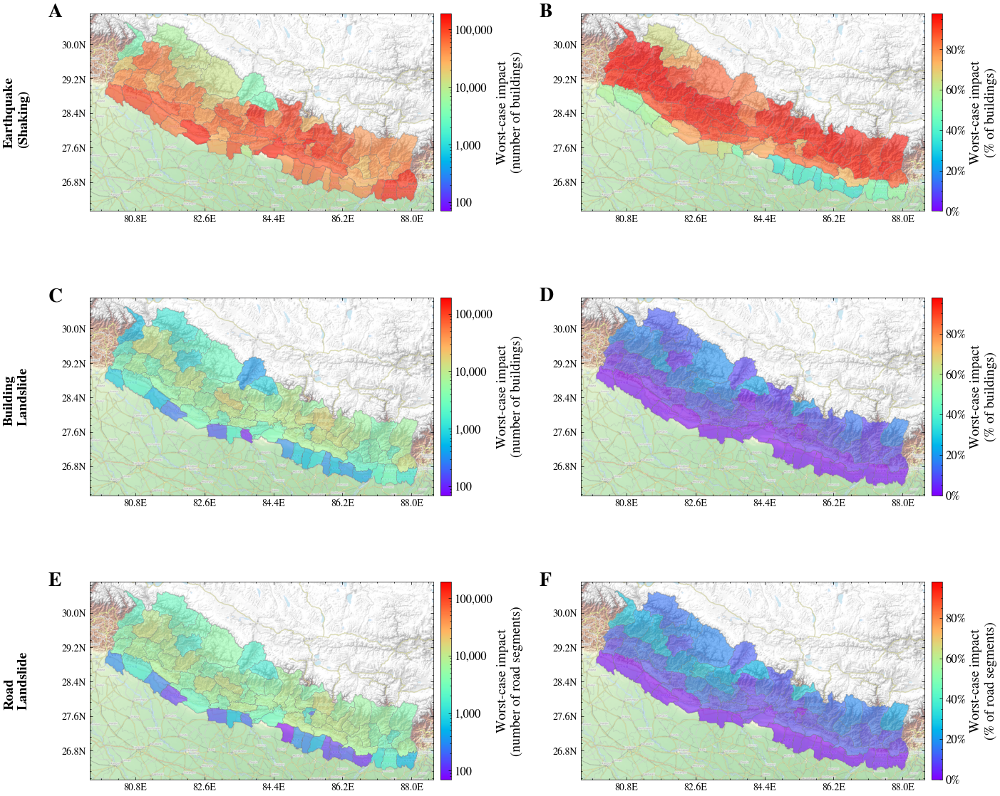

In [31]:
# FIGURE 5: WORST CASE (Absolute and Proportional)
print("Creating Figure 5: Worst-case impacts (absolute and proportional)...")

fig5, axes5 = plt.subplots(3, 2, figsize=(14, 12))

# Use SAME color scheme and scale for all landslide panels
# Get consistent scales across ALL impact types
all_absolute = np.concatenate([
    nepal_admin_impacts['Earthquake_worst'].dropna().values,
    nepal_admin_impacts['BuildingLandslide_worst'].dropna().values,
    nepal_admin_impacts['RoadLandslide_worst'].dropna().values
])
all_proportional = np.concatenate([
    nepal_admin_impacts['PropEarthquake_worst'].dropna().values,
    nepal_admin_impacts['PropBuildingLandslide_worst'].dropna().values,
    nepal_admin_impacts['PropRoadLandslide_worst'].dropna().values
])

vmin_abs = all_absolute[all_absolute > 0].min() if np.any(all_absolute > 0) else 1
vmax_abs = all_absolute.max()
vmin_prop = 0
vmax_prop = all_proportional.max()

cmap = 'rainbow'

# ROW 1: Earthquake (shaking)
create_map(nepal_admin_impacts, 'Earthquake_worst', axes5[0, 0],
          '', cmap, 'log', 'Worst-case impact\n(number of buildings)', vmin=vmin_abs, vmax=vmax_abs)
axes5[0, 0].text(-0.12, 1.05, 'A', transform=axes5[0, 0].transAxes, 
                 fontsize=20, fontweight='bold', va='top')
axes5[0, 0].text(-0.25, 0.5, 'Earthquake\n(Shaking)', transform=axes5[0, 0].transAxes,
                 fontsize=14, fontweight='bold', va='center', rotation=90)

create_map(nepal_admin_impacts, 'PropEarthquake_worst', axes5[0, 1],
          '', cmap, 'identity', 'Worst-case impact\n(% of buildings)', vmin=vmin_prop, vmax=vmax_prop)
axes5[0, 1].text(-0.12, 1.05, 'B', transform=axes5[0, 1].transAxes,
                 fontsize=20, fontweight='bold', va='top')

# ROW 2: Building Landslide
create_map(nepal_admin_impacts, 'BuildingLandslide_worst', axes5[1, 0],
          '', cmap, 'log', 'Worst-case impact\n(number of buildings)', vmin=vmin_abs, vmax=vmax_abs)
axes5[1, 0].text(-0.12, 1.05, 'C', transform=axes5[1, 0].transAxes,
                 fontsize=20, fontweight='bold', va='top')
axes5[1, 0].text(-0.25, 0.5, 'Building\nLandslide', transform=axes5[1, 0].transAxes,
                 fontsize=14, fontweight='bold', va='center', rotation=90)

create_map(nepal_admin_impacts, 'PropBuildingLandslide_worst', axes5[1, 1],
          '', cmap, 'identity', 'Worst-case impact\n(% of buildings)', vmin=vmin_prop, vmax=vmax_prop)
axes5[1, 1].text(-0.12, 1.05, 'D', transform=axes5[1, 1].transAxes,
                 fontsize=20, fontweight='bold', va='top')

# ROW 3: Road Landslide
create_map(nepal_admin_impacts, 'RoadLandslide_worst', axes5[2, 0],
          '', cmap, 'log', 'Worst-case impact\n(number of road segments)', vmin=vmin_abs, vmax=vmax_abs)
axes5[2, 0].text(-0.12, 1.05, 'E', transform=axes5[2, 0].transAxes,
                 fontsize=20, fontweight='bold', va='top')
axes5[2, 0].text(-0.25, 0.5, 'Road\nLandslide', transform=axes5[2, 0].transAxes,
                 fontsize=14, fontweight='bold', va='center', rotation=90)

create_map(nepal_admin_impacts, 'PropRoadLandslide_worst', axes5[2, 1],
          '', cmap, 'identity', 'Worst-case impact\n(% of road segments)', vmin=vmin_prop, vmax=vmax_prop)
axes5[2, 1].text(-0.12, 1.05, 'F', transform=axes5[2, 1].transAxes,
                 fontsize=20, fontweight='bold', va='top')

fig5.tight_layout(h_pad=2.0, w_pad=1.5)
fig5.subplots_adjust(left=0.08)
fig5.savefig(os.path.join(output_dir, "Fig5_worst_case_absolute_proportional.png"), dpi=300, bbox_inches='tight')
# fig5.savefig(os.path.join(output_dir, "Fig5_worst_case_absolute_proportional.pdf"), bbox_inches='tight')
print("✓ Figure 5 saved (worst-case absolute and proportional)")
plt.show()


Creating Figure 7: Standard deviation of impacts...
✓ Figure 7 saved (standard deviation)


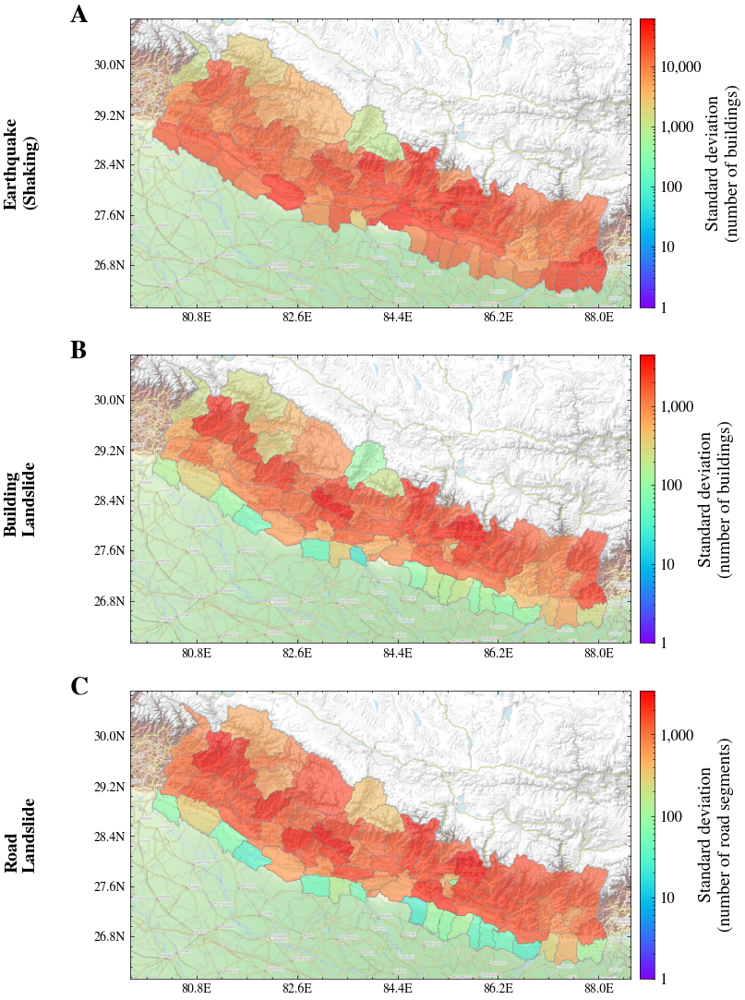

In [19]:
# FIGURE 6: STANDARD DEVIATION
print("Creating Figure 7: Standard deviation of impacts...")

# Calculate standard deviation for each district and impact type
std_dev_data = impact_data.groupby('District').agg(
    Earthquake_std=('Earthquake', 'std'),
    BuildingLandslide_std=('BuildingLandslide', 'std'),
    RoadLandslide_std=('RoadLandslide', 'std')
).reset_index()

# Merge std dev data with impacts
nepal_admin_impacts_std = nepal_admin_impacts.merge(
    std_dev_data, left_on='DISTRICT', right_on='District', how='left', suffixes=('', '_std')
)

fig6, axes6 = plt.subplots(3, 1, figsize=(8, 11))

cmap_std = 'rainbow'

# ROW 1: Earthquake Standard Deviation
create_map(nepal_admin_impacts_std, 'Earthquake_std', axes6[0],
          '', cmap_std, 'log', 'Standard deviation\n(number of buildings)', vmin=1, vmax=None)
axes6[0].text(-0.12, 1.05, 'A', transform=axes6[0].transAxes,
              fontsize=20, fontweight='bold', va='top')
axes6[0].text(-0.25, 0.5, 'Earthquake\n(Shaking)', transform=axes6[0].transAxes,
              fontsize=14, fontweight='bold', va='center', rotation=90)

# ROW 2: Building Landslide Standard Deviation
create_map(nepal_admin_impacts_std, 'BuildingLandslide_std', axes6[1],
          '', cmap_std, 'log', 'Standard deviation\n(number of buildings)', vmin=1, vmax=None)
axes6[1].text(-0.12, 1.05, 'B', transform=axes6[1].transAxes,
              fontsize=20, fontweight='bold', va='top')
axes6[1].text(-0.25, 0.5, 'Building\nLandslide', transform=axes6[1].transAxes,
              fontsize=14, fontweight='bold', va='center', rotation=90)

# ROW 3: Road Landslide Standard Deviation
create_map(nepal_admin_impacts_std, 'RoadLandslide_std', axes6[2],
          '', cmap_std, 'log', 'Standard deviation\n(number of road segments)', vmin=1, vmax=None)
axes6[2].text(-0.12, 1.05, 'C', transform=axes6[2].transAxes,
              fontsize=20, fontweight='bold', va='top')
axes6[2].text(-0.25, 0.5, 'Road\nLandslide', transform=axes6[2].transAxes,
              fontsize=14, fontweight='bold', va='center', rotation=90)

fig6.tight_layout(h_pad=1.5)
fig6.subplots_adjust(left=0.08)
fig6.savefig(os.path.join(output_dir, "Fig6_standard_deviation.png"), dpi=300, bbox_inches='tight')
# fig6.savefig(os.path.join(output_dir, "Fig7_standard_deviation.pdf"), bbox_inches='tight')
print("✓ Figure 7 saved (standard deviation)")
plt.show()


In [20]:
# NOTE: Figure 8 (Mean impacts) has been removed as per reviewer feedback
# Only worst-case scenario is kept in the merged Figure 5 above
print("Figure 8 (Mean impacts) has been removed - only worst-case retained")

Figure 8 (Mean impacts) has been removed - only worst-case retained


---
# ADDITIONAL FIGURES
---

The following sections contain Figure 9 (Fatality maps), Figure 10 (Remoteness analysis), Figure 11 (Proportions), and supplementary figures. These require additional data files that may not be available in all environments.

**Uncomment and run these cells if you have the required data.**

In [21]:
# PLACEHOLDER: Figure 9 - Fatality Maps
# Requires: Ward-level fatality data
# Uncomment and adapt if data is available

# print("Figure 9: Fatality maps - requires additional ward-level data")
# print("Skipping for now. Add implementation if data becomes available.")

## Figure 10: Remoteness Analysis

This section analyzes the relationship between district remoteness (accessibility to health facilities and district headquarters) and multi-hazard impacts.

The figure consists of four panels:
- **Panel A:** Health posts remoteness index map
- **Panel B:** Correlation between District HQ and Health Posts remoteness
- **Panel C:** Percentage of roads affected by landslides vs remoteness categories
- **Panel D:** Total worst-case impact vs remoteness categories

In [22]:
print("Creating Figure 10: Risk analysis with remoteness...")

from sklearn.cluster import KMeans

# Filter remoteness data for facilities
facility_types = ["Health posts and sub-health posts", "District Headquarters"]

# Standardize district names
municipalities_df['DISTRICT'] = municipalities_df['DISTRICT'].str.upper()
muni_district_map = municipalities_df[['Municipality Name', 'DISTRICT']].drop_duplicates()
muni_district_map.rename(columns={'Municipality Name': 'adm_name'}, inplace=True)

remoteness_df = nepal_remoteness.merge(muni_district_map, on='adm_name', how='left')

filtered_remoteness = remoteness_df[remoteness_df['fac_type'].isin(facility_types)].copy()

# Define weights for travel categories
weights = {
    "0 to 30 minutes": 0.0069,
    "30 minutes to 1 hour": 0.0208,
    "1 to 2 hours": 0.0417,
    "2 to 4 hours": 0.0833,
    "4 to 8 hours": 0.1667,
    "8 to 16 hours": 0.3333,
    "16 to 32 hours": 0.6667,
    "> 32 hours": 1
}

filtered_remoteness['weight'] = filtered_remoteness['trav_cat'].map(weights)
filtered_remoteness['weighted_remoteness'] = filtered_remoteness['weight'] * filtered_remoteness['tc_pc_pop']

# Calculate facility-specific remoteness
def calculate_facility_remoteness(data, season='Normal season'):
    season_data = data[data['season'] == season].copy()
    district_remoteness = season_data.groupby('DISTRICT').agg(
        RemoteIndex=('weighted_remoteness', 'sum')
    )
    max_remote = district_remoteness['RemoteIndex'].max()
    if max_remote > 0:
        district_remoteness['RemoteIndex'] = district_remoteness['RemoteIndex'] / max_remote
    return district_remoteness

dhq_remoteness = filtered_remoteness[filtered_remoteness['fac_type'] == 'District Headquarters'].copy()
health_remoteness = filtered_remoteness[filtered_remoteness['fac_type'] == 'Health posts and sub-health posts'].copy()

dhq_normal = calculate_facility_remoteness(dhq_remoteness, 'Normal season')
dhq_monsoon = calculate_facility_remoteness(dhq_remoteness, 'Monsoon season')
health_normal = calculate_facility_remoteness(health_remoteness, 'Normal season')
health_monsoon = calculate_facility_remoteness(health_remoteness, 'Monsoon season')

dhq_normal['DHQ_Monsoon'] = dhq_monsoon['RemoteIndex']
dhq_normal.rename(columns={'RemoteIndex': 'DHQ_Normal'}, inplace=True)
health_normal['Health_Monsoon'] = health_monsoon['RemoteIndex']
health_normal.rename(columns={'RemoteIndex': 'Health_Normal'}, inplace=True)

facility_remoteness = pd.merge(dhq_normal, health_normal, left_index=True, right_index=True, how='outer')

# Merge with impact data
nepal_admin_impacts_copy = nepal_admin_impacts.copy()
nepal_admin_impacts_copy['DISTRICT'] = nepal_admin_impacts_copy['DISTRICT'].str.upper()
nepal_admin_risk = nepal_admin_impacts_copy.merge(facility_remoteness, left_on='DISTRICT', right_index=True, how='left')

# Calculate total worst-case impacts
nepal_admin_risk['TotalImpact_worst'] = (
    nepal_admin_risk['Earthquake_worst'] +
    nepal_admin_risk['BuildingLandslide_worst'] +
    nepal_admin_risk['RoadLandslide_worst']
)

# Statistical categorization using K-means (3 categories: Low, Medium, High)
valid_data = nepal_admin_risk[['DHQ_Normal']].dropna()
if len(valid_data) > 0:
    kmeans = KMeans(n_clusters=3, random_state=42, n_init=10).fit(valid_data)
    nepal_admin_risk.loc[nepal_admin_risk['DHQ_Normal'].notna(), 'Remoteness_Category'] = kmeans.labels_
    
    # Sort categories by mean value to ensure Low < Medium < High
    category_means = nepal_admin_risk.groupby('Remoteness_Category')['DHQ_Normal'].mean().sort_values()
    cat_map = {old_label: new_label for old_label, new_label in 
               zip(category_means.index, ['Low', 'Medium', 'High'])}
    nepal_admin_risk['Remoteness_Category'] = nepal_admin_risk['Remoteness_Category'].map(cat_map)
    
    # Get category boundaries for visualization
    boundaries = nepal_admin_risk.groupby('Remoteness_Category')['DHQ_Normal'].agg(['min', 'max'])
    print(f"Remoteness category boundaries:")
    print(boundaries)

print(f"✓ Calculated remoteness indices for {len(nepal_admin_risk)} districts")

Creating Figure 10: Risk analysis with remoteness...
Remoteness category boundaries:
                          min       max
Remoteness_Category                    
High                 0.750295  1.000000
Low                  0.006282  0.234267
Medium               0.241760  0.513738
✓ Calculated remoteness indices for 77 districts


Creating Figure 10: 4-panel remoteness visualization...
✓ Figure 7 saved


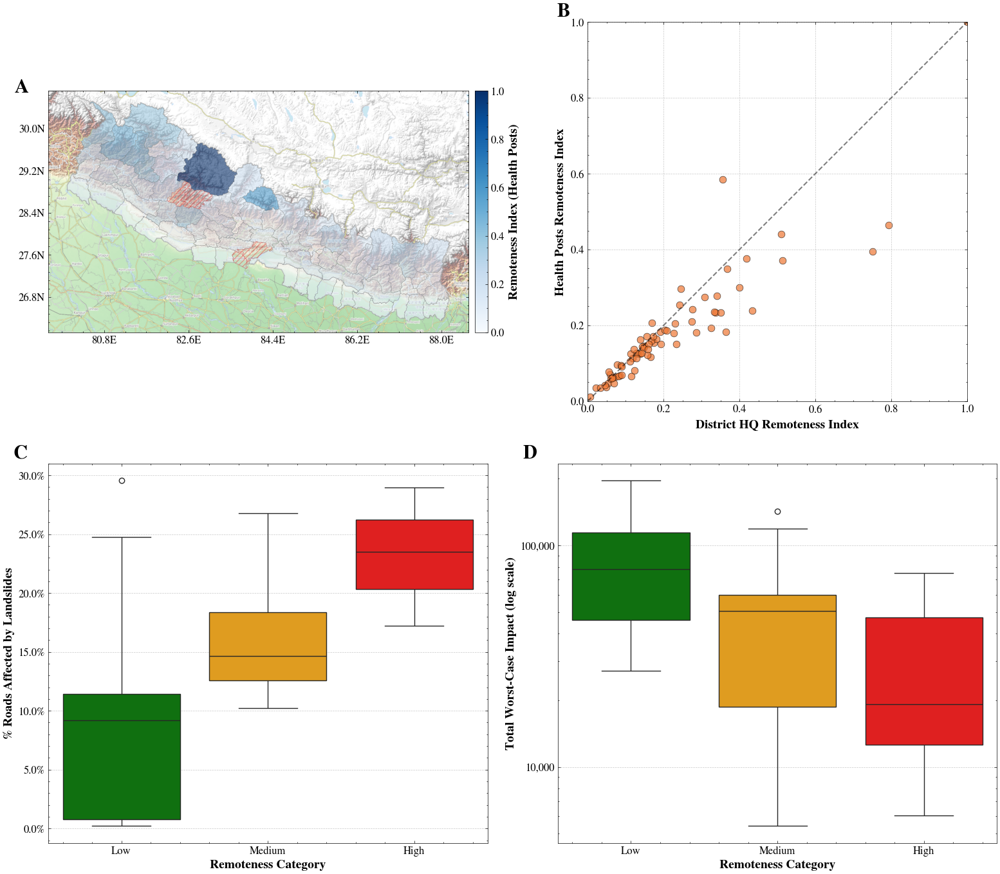

✓ Figure 7 complete: A) Health post remoteness, B) Correlation of indices, C) % Roads vs remoteness, D) Worst case vs remoteness


In [23]:
print("Creating Figure 10: 4-panel remoteness visualization...")

# Create Figure 10 with 2x2 panels
fig9, axes9 = plt.subplots(2, 2, figsize=(16, 14))

# Convert to Web Mercator for contextily
nepal_admin_risk_mercator = nepal_admin_risk.to_crs("EPSG:3857")

# Add lat/lon formatter functions
import matplotlib.ticker as mticker

def format_lon(x, pos):
    lon = x / 20037508.34 * 180
    return f'{lon:.1f}E'

def format_lat(y, pos):
    lat = (2 * np.arctan(np.exp(y / 20037508.34 * 180 * np.pi / 180)) - np.pi / 2) * 180 / np.pi
    return f'{lat:.1f}N'

# =============================================================================
# PANEL A (Upper Left): Health posts remoteness map
# =============================================================================
ax_a = axes9[0, 0]

nepal_admin_risk_mercator.plot(
    column='Health_Normal',
    ax=ax_a,
    cmap='Blues',
    vmin=0,
    vmax=1,
    edgecolor='gray',
    linewidth=0.3,
    alpha=0.6,
    legend=False,
    missing_kwds={'color': 'lightgray', 'edgecolor': 'red', 'hatch': '////', 'alpha': 0.3}
)

# Add contextily basemap
try:
    import contextily as ctx
    ctx.add_basemap(ax_a, crs=nepal_admin_risk_mercator.crs, 
                   source=ctx.providers.OpenTopoMap, 
                   alpha=0.5, attribution=False, zoom=8)
except Exception as e:
    print(f"Could not add basemap to Panel A: {e}")
    ax_a.set_facecolor('lightgray')

# Add colorbar
divider_a = make_axes_locatable(ax_a)
cax_a = divider_a.append_axes("right", size="3%", pad=0.1)
norm_a = colors.Normalize(vmin=0, vmax=1)
sm_a = plt.cm.ScalarMappable(cmap='Blues', norm=norm_a)
sm_a.set_array([])
cbar_a = plt.colorbar(sm_a, cax=cax_a)
cbar_a.set_label('Remoteness Index (Health Posts)', fontsize=14, fontweight='bold')
cbar_a.ax.tick_params(labelsize=12)

ax_a.xaxis.set_major_formatter(mticker.FuncFormatter(format_lon))
ax_a.yaxis.set_major_formatter(mticker.FuncFormatter(format_lat))
ax_a.tick_params(axis='both', labelsize=12)
ax_a.set_aspect('equal', adjustable='box')

# Add panel label
ax_a.text(-0.08, 1.05, 'A', transform=ax_a.transAxes, fontsize=22, fontweight='bold', va='top')

# =============================================================================
# PANEL B (Upper Right): Correlation of remoteness indices (scatter plot)
# =============================================================================
ax_b = axes9[0, 1]

ax_b.scatter(nepal_admin_risk['DHQ_Normal'], nepal_admin_risk['Health_Normal'], 
            alpha=0.7, s=60, edgecolors='black', linewidth=0.5)
ax_b.plot([0, 1], [0, 1], 'k--', alpha=0.5, linewidth=1.5)
ax_b.set_xlabel('District HQ Remoteness Index', fontsize=14, fontweight='bold')
ax_b.set_ylabel('Health Posts Remoteness Index', fontsize=14, fontweight='bold')
ax_b.tick_params(axis='both', labelsize=12)
ax_b.grid(True, linestyle='--', alpha=0.7, linewidth=0.5)
ax_b.set_aspect('equal')
ax_b.set_xlim(0, 1)
ax_b.set_ylim(0, 1)

# Add panel label
ax_b.text(-0.08, 1.05, 'B', transform=ax_b.transAxes, fontsize=22, fontweight='bold', va='top')

# =============================================================================
# PANEL C (Lower Left): % roads affected by landslide vs remoteness categories
# =============================================================================
ax_c = axes9[1, 0]

if 'Remoteness_Category' in nepal_admin_risk.columns:
    # Calculate proportion of roads affected by landslides for each district
    nepal_admin_risk['PropRoadLandslide_worst_percent'] = nepal_admin_risk['PropRoadLandslide_worst']
    
    # Create box plot
    category_order = ['Low', 'Medium', 'High']
    valid_categories = nepal_admin_risk['Remoteness_Category'].dropna().unique()
    plot_order = [cat for cat in category_order if cat in valid_categories]
    
    sns.boxplot(x='Remoteness_Category', y='PropRoadLandslide_worst_percent',
               data=nepal_admin_risk, ax=ax_c, order=plot_order,
               palette=['green', 'orange', 'red'])
    ax_c.set_xlabel('Remoteness Category', fontsize=14, fontweight='bold')
    ax_c.set_ylabel('% Roads Affected by Landslides', fontsize=14, fontweight='bold')
    ax_c.tick_params(axis='both', labelsize=12)
    ax_c.grid(True, axis='y', linestyle='--', alpha=0.7, linewidth=0.5)
    
    # Format y-axis as percentage
    ax_c.yaxis.set_major_formatter(ticker.PercentFormatter(decimals=1))
else:
    ax_c.text(0.5, 0.5, 'Remoteness categories\nnot available',
             ha='center', va='center', transform=ax_c.transAxes, fontsize=14)

# Add panel label
ax_c.text(-0.08, 1.05, 'C', transform=ax_c.transAxes, fontsize=22, fontweight='bold', va='top')

# =============================================================================
# PANEL D (Lower Right): Current worst case vs remoteness categories
# =============================================================================
ax_d = axes9[1, 1]

if 'Remoteness_Category' in nepal_admin_risk.columns:
    # Create box plot showing worst-case total impact vs remoteness categories
    category_order = ['Low', 'Medium', 'High']
    valid_categories = nepal_admin_risk['Remoteness_Category'].dropna().unique()
    plot_order = [cat for cat in category_order if cat in valid_categories]
    
    sns.boxplot(x='Remoteness_Category', y='TotalImpact_worst',
               data=nepal_admin_risk, ax=ax_d, order=plot_order,
               palette=['green', 'orange', 'red'])
    ax_d.set_yscale('log')
    ax_d.set_xlabel('Remoteness Category', fontsize=14, fontweight='bold')
    ax_d.set_ylabel('Total Worst-Case Impact (log scale)', fontsize=14, fontweight='bold')
    ax_d.tick_params(axis='both', labelsize=12)
    ax_d.grid(True, axis='y', linestyle='--', alpha=0.7, linewidth=0.5)
    
    # Format y-axis with commas
    ax_d.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f'{x:,.0f}'))
else:
    ax_d.text(0.5, 0.5, 'Remoteness categories\nnot available',
             ha='center', va='center', transform=ax_d.transAxes, fontsize=14)

# Add panel label
ax_d.text(-0.08, 1.05, 'D', transform=ax_d.transAxes, fontsize=22, fontweight='bold', va='top')

# =============================================================================
# Save figure
# =============================================================================
fig9.tight_layout(pad=2.0)
fig9.savefig(os.path.join(output_dir, "Fig7_remoteness_analysis.png"), dpi=300, bbox_inches='tight')
# fig9.savefig(os.path.join(output_dir, "Fig10_remoteness_analysis.pdf"), bbox_inches='tight')
print("✓ Figure 7 saved")
plt.show()

print("✓ Figure 7 complete: A) Health post remoteness, B) Correlation of indices, C) % Roads vs remoteness, D) Worst case vs remoteness")

## Figure 11: Multi-Hazard Risk Scores

This section calculates and visualizes two complementary risk scores that combine remoteness with multi-hazard impacts.

### Risk Score Formulas

We define the following normalized variables:

* $R$: Normalized remoteness index = $\frac{\text{remoteness}}{\max(\text{remoteness})}$
* $S$: Worst-case shaking damage (absolute or proportional)
* $L$: Worst-case landslide damage (absolute or proportional)

Both risk scores use a **weighted sum approach** where remoteness and hazard impact are treated as independent components with equal weight (50% each).

---

#### 1. Absolute Compounding Risk Score

**Purpose:** Identify large-scale disaster hotspots for humanitarian resource prioritization.

**Formula:** 
$$\text{Risk Score}_{\text{Absolute}} = 0.5 \times R + 0.5 \times \frac{S + L}{\max(S + L)}$$

where $R$ is the normalized remoteness index, $S$ is the absolute number of buildings damaged by shaking, and $L$ is the absolute number of buildings and road segments damaged by landslides.

**Interpretation:** Districts score high if they have EITHER high remoteness OR high total impact (or both). The score ranges from 0 to 1, combining accessibility challenges with disaster magnitude.

---

#### 2. Normalized Risk Score

**Purpose:** Identify severely threatened communities regardless of size.

**Formula:**
$$\text{Risk Score}_{\text{Normalized}} = 0.5 \times R + 0.5 \times \left[\frac{S_{\text{prop}}}{\max(S_{\text{prop}})} + \frac{L_{\text{prop}}}{\max(L_{\text{prop}})}\right] / 2$$

Simplified:
$$\text{Risk Score}_{\text{Normalized}} = 0.5 \times R + 0.25 \times \frac{S_{\text{prop}}}{\max(S_{\text{prop}})} + 0.25 \times \frac{L_{\text{prop}}}{\max(L_{\text{prop}})}$$

where $S_{\text{prop}}$ is the percentage of buildings damaged by shaking, and $L_{\text{prop}}$ is the percentage of buildings and roads damaged by landslides. Each hazard is normalized independently.

**Interpretation:** Small, remote districts that lose high percentages of their infrastructure score high, even if absolute numbers are low. Highlights communities needing targeted resilience intervention.

In [11]:
print("Calculating Multi-Hazard Risk Scores (WEIGHTED SUM)...")

# =============================================================================
# Calculate normalized variables for risk scores
# =============================================================================

# R: Normalized remoteness index (using DHQ remoteness for both scores)
max_remoteness = nepal_admin_risk['DHQ_Normal'].max()
nepal_admin_risk['R_normalized'] = nepal_admin_risk['DHQ_Normal'] / max_remoteness if max_remoteness > 0 else nepal_admin_risk['DHQ_Normal']

# =============================================================================
# ABSOLUTE COMPOUNDING RISK SCORE: 0.5×R + 0.5×[(S + L) / max(S + L)]
# =============================================================================
# Calculate total absolute impacts (Earthquake + Building Landslide + Road Landslide)
nepal_admin_risk['Total_Absolute_Impact'] = (
    nepal_admin_risk['Earthquake_worst'] + 
    nepal_admin_risk['BuildingLandslide_worst'] + 
    nepal_admin_risk['RoadLandslide_worst']
)

# Normalize the total impact
max_total_impact = nepal_admin_risk['Total_Absolute_Impact'].max()
nepal_admin_risk['Total_Impact_Normalized'] = (
    nepal_admin_risk['Total_Absolute_Impact'] / max_total_impact 
    if max_total_impact > 0 else 0
)

# Calculate Absolute Risk Score: weighted sum
nepal_admin_risk['RiskScore_Absolute'] = (
    0.5 * nepal_admin_risk['R_normalized'] + 
    0.5 * nepal_admin_risk['Total_Impact_Normalized']
)

# =============================================================================
# NORMALIZED RISK SCORE: 0.5×R + 0.5×[S_prop/max + L_prop/max]
# =============================================================================
# Calculate total proportional impacts for each hazard type
# S_prop: Proportional shaking damage (already as percentage)
nepal_admin_risk['S_prop'] = nepal_admin_risk['PropEarthquake_worst'].fillna(0)

# L_prop: Total proportional landslide damage (buildings + roads)
nepal_admin_risk['L_prop'] = (
    nepal_admin_risk['PropBuildingLandslide_worst'].fillna(0) + 
    nepal_admin_risk['PropRoadLandslide_worst'].fillna(0)
)

# Normalize each independently
max_S_prop = nepal_admin_risk['S_prop'].max()
max_L_prop = nepal_admin_risk['L_prop'].max()

nepal_admin_risk['S_prop_normalized'] = (
    nepal_admin_risk['S_prop'] / max_S_prop 
    if max_S_prop > 0 else 0
)
nepal_admin_risk['L_prop_normalized'] = (
    nepal_admin_risk['L_prop'] / max_L_prop 
    if max_L_prop > 0 else 0
)

# Calculate combined hazard score (average of normalized shaking and landslide)
nepal_admin_risk['Hazard_Combined_Normalized'] = (
    nepal_admin_risk['S_prop_normalized'] + nepal_admin_risk['L_prop_normalized']
) / 2.0

# Calculate Normalized Risk Score: weighted sum
nepal_admin_risk['RiskScore_Normalized'] = (
    0.5 * nepal_admin_risk['R_normalized'] + 
    0.5 * nepal_admin_risk['Hazard_Combined_Normalized']
)

# =============================================================================
# Print summary statistics
# =============================================================================
print("\n" + "="*70)
print("RISK SCORE SUMMARY STATISTICS (WEIGHTED SUM)")
print("="*70)

print("\nAbsolute Compounding Risk Score: 0.5×R + 0.5×[(S+L)/max]")
print(f"  Formula: 50% Remoteness + 50% Total Impact")
print(f"  Mean: {nepal_admin_risk['RiskScore_Absolute'].mean():.3f}")
print(f"  Median: {nepal_admin_risk['RiskScore_Absolute'].median():.3f}")
print(f"  Std Dev: {nepal_admin_risk['RiskScore_Absolute'].std():.3f}")
print(f"  Min: {nepal_admin_risk['RiskScore_Absolute'].min():.3f}")
print(f"  Max: {nepal_admin_risk['RiskScore_Absolute'].max():.3f}")

print("\nNormalized Risk Score: 0.5×R + 0.5×[(S+L)/2]")
print(f"  Formula: 50% Remoteness + 50% Average Hazard Impact")
print(f"  Mean: {nepal_admin_risk['RiskScore_Normalized'].mean():.3f}")
print(f"  Median: {nepal_admin_risk['RiskScore_Normalized'].median():.3f}")
print(f"  Std Dev: {nepal_admin_risk['RiskScore_Normalized'].std():.3f}")
print(f"  Min: {nepal_admin_risk['RiskScore_Normalized'].min():.3f}")
print(f"  Max: {nepal_admin_risk['RiskScore_Normalized'].max():.3f}")

# Top 5 districts by each score
print("\nTop 5 Districts by Absolute Compounding Risk Score:")
top_abs = nepal_admin_risk.nlargest(5, 'RiskScore_Absolute')[
    ['DISTRICT', 'RiskScore_Absolute', 'R_normalized', 'Total_Impact_Normalized', 'Total_Absolute_Impact']
]
for idx, row in top_abs.iterrows():
    print(f"  {row['DISTRICT']}: {row['RiskScore_Absolute']:.3f}")
    print(f"    (Remoteness: {row['R_normalized']:.3f}, Impact: {row['Total_Impact_Normalized']:.3f}, Total: {row['Total_Absolute_Impact']:.0f})")

print("\nTop 5 Districts by Normalized Risk Score:")
top_norm = nepal_admin_risk.nlargest(5, 'RiskScore_Normalized')[
    ['DISTRICT', 'RiskScore_Normalized', 'R_normalized', 'Hazard_Combined_Normalized']
]
for idx, row in top_norm.iterrows():
    print(f"  {row['DISTRICT']}: {row['RiskScore_Normalized']:.3f}")
    print(f"    (Remoteness: {row['R_normalized']:.3f}, Hazard: {row['Hazard_Combined_Normalized']:.3f})")

print("="*70)
print("✓ Risk scores calculated successfully with weighted sum formulas\n")

Calculating Multi-Hazard Risk Scores (WEIGHTED SUM)...


NameError: name 'nepal_admin_risk' is not defined

Creating Figure 11: Multi-Hazard Risk Score Maps...
✓ Figure 8 saved


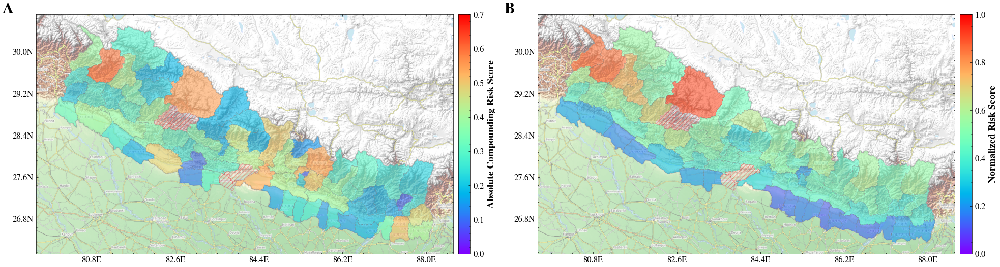

✓ Figure 8 complete: A) Absolute Compounding Risk Score, B) Normalized Risk Score


In [ ]:
print("Creating Figure 11: Multi-Hazard Risk Score Maps...")

# Create Figure 11 with 2 panels (1 row, 2 columns)
fig10, axes10 = plt.subplots(2, 1, figsize=(8, 11))

# Convert to Web Mercator for contextily
nepal_admin_risk_mercator = nepal_admin_risk.to_crs("EPSG:3857")

# Add lat/lon formatter functions
import matplotlib.ticker as mticker

def format_lon(x, pos):
    lon = x / 20037508.34 * 180
    return f'{lon:.1f}E'

def format_lat(y, pos):
    lat = (2 * np.arctan(np.exp(y / 20037508.34 * 180 * np.pi / 180)) - np.pi / 2) * 180 / np.pi
    return f'{lat:.1f}N'

# =============================================================================
# PANEL A (Left): Absolute Compounding Risk Score
# =============================================================================
ax_a = axes10[0]

Vm = 0.7

nepal_admin_risk_mercator.plot(
    column='RiskScore_Absolute',
    ax=ax_a,
    cmap='rainbow',
    vmin=0,
    vmax=Vm,
    edgecolor='gray',
    linewidth=0.3,
    alpha=0.6,
    legend=False,
    missing_kwds={'color': 'lightgray', 'edgecolor': 'red', 'hatch': '////', 'alpha': 0.3}
)

# Add contextily basemap
try:
    import contextily as ctx
    ctx.add_basemap(ax_a, crs=nepal_admin_risk_mercator.crs, 
                   source=ctx.providers.OpenTopoMap, 
                   alpha=0.5, attribution=False, zoom=8)
except Exception as e:
    print(f"Could not add basemap to Panel A: {e}")
    ax_a.set_facecolor('lightgray')

# Add colorbar
divider_a = make_axes_locatable(ax_a)
cax_a = divider_a.append_axes("right", size="3%", pad=0.1)
norm_a = colors.Normalize(vmin=0, vmax=Vm)
sm_a = plt.cm.ScalarMappable(cmap='rainbow', norm=norm_a)
sm_a.set_array([])
cbar_a = plt.colorbar(sm_a, cax=cax_a)
cbar_a.set_label('Absolute Compounding Risk Score', fontsize=14, fontweight='bold')
cbar_a.ax.tick_params(labelsize=12)

ax_a.xaxis.set_major_formatter(mticker.FuncFormatter(format_lon))
ax_a.yaxis.set_major_formatter(mticker.FuncFormatter(format_lat))
ax_a.tick_params(axis='both', labelsize=12)
ax_a.set_aspect('equal', adjustable='box')

# Add panel label
ax_a.text(-0.08, 1.05, 'A', transform=ax_a.transAxes, fontsize=22, fontweight='bold', va='top')

# =============================================================================
# PANEL B (Right): Normalized Risk Score
# =============================================================================
ax_b = axes10[1]

nepal_admin_risk_mercator.plot(
    column='RiskScore_Normalized',
    ax=ax_b,
    cmap='rainbow',
    vmin=0,
    vmax=1,
    edgecolor='gray',
    linewidth=0.3,
    alpha=0.6,
    legend=False,
    missing_kwds={'color': 'lightgray', 'edgecolor': 'red', 'hatch': '////', 'alpha': 0.3}
)

# Add contextily basemap
try:
    ctx.add_basemap(ax_b, crs=nepal_admin_risk_mercator.crs, 
                   source=ctx.providers.OpenTopoMap, 
                   alpha=0.5, attribution=False, zoom=8)
except Exception as e:
    print(f"Could not add basemap to Panel B: {e}")
    ax_b.set_facecolor('lightgray')

# Add colorbar
divider_b = make_axes_locatable(ax_b)
cax_b = divider_b.append_axes("right", size="3%", pad=0.1)
norm_b = colors.Normalize(vmin=0, vmax=1)
sm_b = plt.cm.ScalarMappable(cmap='rainbow', norm=norm_b)
sm_b.set_array([])
cbar_b = plt.colorbar(sm_b, cax=cax_b)
cbar_b.set_label('Normalized Risk Score', fontsize=14, fontweight='bold')
cbar_b.ax.tick_params(labelsize=12)

ax_b.xaxis.set_major_formatter(mticker.FuncFormatter(format_lon))
ax_b.yaxis.set_major_formatter(mticker.FuncFormatter(format_lat))
ax_b.tick_params(axis='both', labelsize=12)
ax_b.set_aspect('equal', adjustable='box')

# Add panel label
ax_b.text(-0.08, 1.05, 'B', transform=ax_b.transAxes, fontsize=22, fontweight='bold', va='top')

# =============================================================================
# Save figure
# =============================================================================
fig10.tight_layout(pad=2.0)
fig10.savefig(os.path.join(output_dir, "Fig8_risk_scores.png"), dpi=300, bbox_inches='tight')
# fig10.savefig(os.path.join(output_dir, "Fig11_risk_scores.pdf"), bbox_inches='tight')
print("✓ Figure 8 saved")
plt.show()

print("✓ Figure 8 complete: A) Absolute Compounding Risk Score, B) Normalized Risk Score")

## Comparison with Robinson et al. (2018)

Robinson et al. (2018) calculated seismic risk scores for Nepal using a similar approach with **6 equally-weighted metrics**: fatality frequency, median fatalities, maximum fatalities, variation/specificity, remoteness, and HDI.

We compare their district-level aggregated scores with our multi-hazard risk scores.

In [26]:
print("Loading Robinson et al. (2018) district scores...")

# Load Robinson's district-level scores (based on old 75-district structure)
robinson_file = os.path.join(base_dir, "scripts/postprocessing/revision_v0/robinson_district_scores.csv")
robinson_scores = pd.read_csv(robinson_file)

print(f"✓ Loaded Robinson scores for {len(robinson_scores)} districts (old administrative structure)")

# =============================================================================
# DISTRICT NAME STANDARDIZATION AND MAPPING
# =============================================================================
# Robinson uses the old 75-district structure (pre-2015), but current Nepal has 77 districts
# Key changes:
# - Nawalparasi was split into Nawalparasi East and Nawalparasi West
# - Rukum was split into Rukum East and Rukum West
# - Some districts have spelling variations

# Create comprehensive district name mapping
district_name_map = {
    # Spelling corrections from Robinson data
    'Mananag': 'MANANG',           # Typo in Robinson data
    'lamjung': 'LAMJUNG',          # Lowercase in Robinson data
    'Illam': 'ILAM',               # Extra 'l' in Robinson data
    'Kavrepalanchowk': 'KAVREPALANCHOK',  # Different transliteration
    'Kavrepalanchok': 'KAVREPALANCHOK',   # Alternative spelling
    
    # Spelling corrections from our data (map our names to Robinson's standard)
    'CHITAWAN': 'CHITWAN',
    'KABHREPALANCHOK': 'KAVREPALANCHOK',
    'KAPILBASTU': 'KAPILWASTU',
    'MAKAWANPUR': 'MAKWANPUR',
    'SANKHUWASABHA': 'SANGKHUWASABHA',
    'SINDHUPALCHOK': 'SINDHUPALCHOWK',
    'TANAHU': 'TANAHUN',
    'UDAYAPUR': 'UDAYPUR',
    
    # District splits - Old unified districts split into East/West
    'Nawalparasi': 'NAWALPARASI',  # Parent district (will be split)
    'NAWALPUR': 'NAWALPARASI',     # Nawalparasi West (informal name)
    'PARASI': 'NAWALPARASI',       # Nawalparasi East (informal name)
    'Rukum': 'RUKUM',              # Parent district (will be split)
}

# Standardize Robinson district names to uppercase
robinson_scores['District_Original'] = robinson_scores['District']
robinson_scores['District_Standard'] = robinson_scores['District'].str.upper()

# Apply manual corrections to Robinson data
for old_name, new_name in district_name_map.items():
    robinson_scores.loc[robinson_scores['District_Original'] == old_name, 'District_Standard'] = new_name

# =============================================================================
# HANDLE SPLIT DISTRICTS
# =============================================================================
# For split districts:
# - ABSOLUTE values (Median, Maximum fatalities): divide by 2
# - RELATIVE/NORMALIZED values (Frequency, Variation, Remoteness, HDI, all /1 scores): keep same

split_districts = {
    'NAWALPARASI': ['NAWALPARASI (BARDAGHAT SUSTA PURBA)', 'NAWALPARASI (BARDAGHAT SUSTA PASCHIM)',
                     'NAWALPARASI EAST', 'NAWALPARASI WEST', 'NAWALPARASI',
                     'NAWALPUR', 'PARASI'],  # Informal names for West and East
    'RUKUM': ['RUKUM EAST', 'RUKUM WEST', 'RUKUM PURBA', 'RUKUM PASCHIM', 'RUKUM']
}

# Define which columns are absolute (should be divided) vs relative (should stay same)
absolute_columns = ['Median', 'Maximum']  # Absolute fatality counts
relative_columns = ['Frequency', 'Variation', 'Remoteness', 'HDI',  # Relative/intensive properties
                   'Frequency (/1)', 'Median (/1)', 'Maximum (/1)', 'Variation (/1)',  # Normalized
                   'Remoteness (/1)', 'HDI (/1)', 'Total (/6)', 'Robinson_Risk_Score']  # Normalized scores

# Create expanded Robinson dataset with split districts
robinson_expanded = []
for idx, row in robinson_scores.iterrows():
    dist_std = row['District_Standard']
    if dist_std in split_districts:
        # District was split - create entries for each variant
        for variant in split_districts[dist_std]:
            row_copy = row.copy()
            row_copy['District_Standard'] = variant

            # Divide absolute values by 2 (approximate distribution)
            for col in absolute_columns:
                if col in row_copy.index:
                    row_copy[col] = row_copy[col] / 2.0

            # Relative values stay the same (already checked they're in the dataframe)
            # No modification needed for relative_columns

            row_copy['District_Split_Note'] = f"Split from {dist_std} (absolute values ÷2, relative values unchanged)"
            robinson_expanded.append(row_copy)
    else:
        row['District_Split_Note'] = ""
        robinson_expanded.append(row)

robinson_scores_expanded = pd.DataFrame(robinson_expanded)

print(f"✓ Expanded Robinson data to {len(robinson_scores_expanded)} rows (handling split districts)")
print(f"  - Absolute values (Median, Maximum) divided by 2 for split districts")
print(f"  - Relative values (Remoteness, HDI, Risk Scores) unchanged for split districts")

# =============================================================================
# MERGE WITH OUR RISK SCORES
# =============================================================================
nepal_admin_comparison = nepal_admin_risk.copy()
nepal_admin_comparison['DISTRICT_UPPER'] = nepal_admin_comparison['DISTRICT'].str.upper().str.strip()

# Apply name corrections to our district names as well
for old_name, new_name in district_name_map.items():
    nepal_admin_comparison.loc[nepal_admin_comparison['DISTRICT_UPPER'] == old_name.upper(), 'DISTRICT_UPPER'] = new_name

# Merge Robinson scores
nepal_admin_comparison = nepal_admin_comparison.merge(
    robinson_scores_expanded[['District_Standard', 'District_Original', 'District_Split_Note',
                               'Frequency', 'Median', 'Maximum', 'Variation',
                               'Remoteness', 'HDI', 'Remoteness (/1)',
                               'HDI (/1)', 'Total (/6)', 'Robinson_Risk_Score']],
    left_on='DISTRICT_UPPER',
    right_on='District_Standard',
    how='left'
)

# =============================================================================
# MATCHING STATISTICS
# =============================================================================
matched = nepal_admin_comparison['Robinson_Risk_Score'].notna().sum()
total = len(nepal_admin_comparison)

print("\n" + "="*70)
print("DISTRICT MATCHING RESULTS")
print("="*70)
print(f"✓ Matched {matched}/{total} districts with Robinson data")
print(f"  Success rate: {100*matched/total:.1f}%")

# Show districts that didn't match
unmatched_ours = nepal_admin_comparison[nepal_admin_comparison['Robinson_Risk_Score'].isna()]['DISTRICT'].tolist()
if unmatched_ours:
    print(f"\n⚠ Districts in our data NOT matched with Robinson ({len(unmatched_ours)}):")
    for dist in sorted(unmatched_ours):
        print(f"  - {dist}")

# Show Robinson districts not in our data
our_districts_upper = set(nepal_admin_comparison['DISTRICT_UPPER'].unique())
robinson_districts_original = set(robinson_scores['District_Standard'].unique())
unmatched_robinson = robinson_districts_original - our_districts_upper

# Filter out the split district parent names if they're expected to be missing
expected_missing = {'NAWALPARASI', 'RUKUM'}
unmatched_robinson_real = unmatched_robinson - expected_missing

if unmatched_robinson_real:
    print(f"\n⚠ Districts in Robinson data NOT in our dataset ({len(unmatched_robinson_real)}):")
    for dist in sorted(unmatched_robinson_real):
        print(f"  - {dist}")

# Show split district handling
split_handled = nepal_admin_comparison[nepal_admin_comparison['District_Split_Note'] != ""]
if len(split_handled) > 0:
    print(f"\n✓ Handled split districts ({len(split_handled)}):")
    for idx, row in split_handled[['DISTRICT', 'Median', 'Robinson_Risk_Score', 'District_Split_Note']].drop_duplicates('DISTRICT').iterrows():
        print(f"  - {row['DISTRICT']:30s}  Median={row['Median']:6.1f}  Risk={row['Robinson_Risk_Score']:.3f}")
    print(f"    Note: Median fatalities divided by 2, Risk Score unchanged")
# =============================================================================
# DETAILED DISTRICT MATCHING DIAGNOSTICS
# =============================================================================
print("\n" + "="*70)
print("DETAILED MATCHING DIAGNOSTICS")
print("="*70)

# Get all unique districts from our data
our_districts = sorted(nepal_admin_comparison['DISTRICT_UPPER'].unique())
robinson_districts_all = sorted(robinson_scores['District_Standard'].unique())

print(f"\nOur dataset: {len(our_districts)} districts")
print(f"Robinson dataset: {len(robinson_districts_all)} districts (before splitting)")

# Find exact matches (before considering split districts)
exact_matches = set(our_districts) & set(robinson_districts_all)
print(f"\nExact matches: {len(exact_matches)} districts")

# Districts in our data not in Robinson (excluding split district variants)
our_only = set(our_districts) - set(robinson_districts_all)
# Remove expected new districts from split
split_variants = {'NAWALPARASI EAST', 'NAWALPARASI WEST', 'NAWALPARASI (BARDAGHAT SUSTA PURBA)', 
                  'NAWALPARASI (BARDAGHAT SUSTA PASCHIM)', 'RUKUM EAST', 'RUKUM WEST',
                  'RUKUM PURBA', 'RUKUM PASCHIM'}
our_only_real = our_only - split_variants

if our_only_real:
    print(f"\n⚠ Districts in OUR data NOT in Robinson ({len(our_only_real)}):")
    for dist in sorted(our_only_real):
        # Check if it's similar to any Robinson district
        similar = []
        for rob_dist in robinson_districts_all:
            if rob_dist in dist or dist in rob_dist:
                similar.append(rob_dist)
        if similar:
            print(f"  - {dist:30s}  (similar to: {', '.join(similar)})")
        else:
            print(f"  - {dist}")

# Districts in Robinson not in our data (excluding parent districts that were split)
robinson_only = set(robinson_districts_all) - set(our_districts)
robinson_only_real = robinson_only - expected_missing

if robinson_only_real:
    print(f"\n⚠ Districts in ROBINSON NOT in our data ({len(robinson_only_real)}):")
    for dist in sorted(robinson_only_real):
        # Check if it's similar to any of our districts
        similar = []
        for our_dist in our_districts:
            if our_dist in dist or dist in our_dist:
                similar.append(our_dist)
        if similar:
            print(f"  - {dist:30s}  (similar to: {', '.join(similar)})")
        else:
            print(f"  - {dist}")

# Check for potential name mismatches (Levenshtein distance could help but keeping it simple)
print(f"\n💡 Potential naming issues to check:")
unmatched_ours = our_only_real
unmatched_robinson = robinson_only_real

for our_dist in sorted(unmatched_ours):
    for rob_dist in sorted(unmatched_robinson):
        # Check for similar names (simple heuristic: sharing significant substring)
        our_parts = set(our_dist.split())
        rob_parts = set(rob_dist.split())
        if our_parts & rob_parts:  # If they share any words
            print(f"  - '{our_dist}' might match '{rob_dist}'")

# =============================================================================
# COMPARISON SUMMARY
# =============================================================================
print("\n" + "="*70)
print("RISK SCORE COMPARISON SUMMARY")
print("="*70)

# Only use matched districts for statistics
matched_data = nepal_admin_comparison[nepal_admin_comparison['Robinson_Risk_Score'].notna()]

print(f"\nOur Absolute Risk Score:")
print(f"  Mean: {matched_data['RiskScore_Absolute'].mean():.3f}")
print(f"  Range: [{matched_data['RiskScore_Absolute'].min():.3f}, {matched_data['RiskScore_Absolute'].max():.3f}]")

print(f"\nOur Normalized Risk Score:")
print(f"  Mean: {matched_data['RiskScore_Normalized'].mean():.3f}")
print(f"  Range: [{matched_data['RiskScore_Normalized'].min():.3f}, {matched_data['RiskScore_Normalized'].max():.3f}]")

print(f"\nRobinson Risk Score:")
print(f"  Mean: {matched_data['Robinson_Risk_Score'].mean():.3f}")
print(f"  Range: [{matched_data['Robinson_Risk_Score'].min():.3f}, {matched_data['Robinson_Risk_Score'].max():.3f}]")

print("="*70 + "\n")


Loading Robinson et al. (2018) district scores...
✓ Loaded Robinson scores for 75 districts (old administrative structure)
✓ Expanded Robinson data to 85 rows (handling split districts)
  - Absolute values (Median, Maximum) divided by 2 for split districts
  - Relative values (Remoteness, HDI, Risk Scores) unchanged for split districts

DISTRICT MATCHING RESULTS
✓ Matched 77/77 districts with Robinson data
  Success rate: 100.0%

✓ Handled split districts (4):
  - NAWALPUR                        Median= 518.6  Risk=0.699
  - PARASI                          Median= 518.6  Risk=0.699
  - RUKUM EAST                      Median= 281.7  Risk=0.928
  - RUKUM WEST                      Median= 281.7  Risk=0.928
    Note: Median fatalities divided by 2, Risk Score unchanged

DETAILED MATCHING DIAGNOSTICS

Our dataset: 76 districts
Robinson dataset: 75 districts (before splitting)

Exact matches: 74 districts

💡 Potential naming issues to check:

RISK SCORE COMPARISON SUMMARY

Our Absolute Risk 

In [27]:
# DIAGNOSTIC: Check data quality
print("Data Quality Check:")
print("="*70)
print(f"Total districts in nepal_admin_comparison: {len(nepal_admin_comparison)}")
print(f"\nDistricts with Robinson scores: {nepal_admin_comparison['Robinson_Risk_Score'].notna().sum()}")
print(f"Districts with RiskScore_Absolute: {nepal_admin_comparison['RiskScore_Absolute'].notna().sum()}")
print(f"Districts with RiskScore_Normalized: {nepal_admin_comparison['RiskScore_Normalized'].notna().sum()}")

# Check for NaN values in the matched data
matched_check = nepal_admin_comparison[nepal_admin_comparison['Robinson_Risk_Score'].notna()]
print(f"\nAmong {len(matched_check)} districts with Robinson scores:")
print(f"  - RiskScore_Absolute has NaN: {matched_check['RiskScore_Absolute'].isna().sum()}")
print(f"  - RiskScore_Normalized has NaN: {matched_check['RiskScore_Normalized'].isna().sum()}")

# Show districts with Robinson scores but missing our risk scores
problematic = matched_check[matched_check['RiskScore_Absolute'].isna() | matched_check['RiskScore_Normalized'].isna()]
if len(problematic) > 0:
    print(f"\n⚠ Districts with Robinson scores but missing our risk scores ({len(problematic)}):")
    for idx, row in problematic[['DISTRICT', 'RiskScore_Absolute', 'RiskScore_Normalized', 'Robinson_Risk_Score']].iterrows():
        print(f"  - {row['DISTRICT']:20s}  Abs={row['RiskScore_Absolute']}  Norm={row['RiskScore_Normalized']}  Rob={row['Robinson_Risk_Score']:.3f}")
else:
    print(f"\n✓ All matched districts have complete risk score data")

print("="*70 + "\n")


Data Quality Check:
Total districts in nepal_admin_comparison: 77

Districts with Robinson scores: 77
Districts with RiskScore_Absolute: 73
Districts with RiskScore_Normalized: 73

Among 77 districts with Robinson scores:
  - RiskScore_Absolute has NaN: 4
  - RiskScore_Normalized has NaN: 4

⚠ Districts with Robinson scores but missing our risk scores (4):
  - NAWALPUR              Abs=nan  Norm=nan  Rob=0.699
  - PARASI                Abs=nan  Norm=nan  Rob=0.699
  - RUKUM EAST            Abs=nan  Norm=nan  Rob=0.928
  - RUKUM WEST            Abs=nan  Norm=nan  Rob=0.928



In [41]:
print("Calculating correlations between risk scores...")

# Calculate correlations only for matched districts
matched_data = nepal_admin_comparison[nepal_admin_comparison['Robinson_Risk_Score'].notna()].copy()

print(f"\nUsing {len(matched_data)} matched districts for correlation analysis")

# Remove any rows with NaN in the risk score columns
correlation_data = matched_data[['DISTRICT', 'RiskScore_Absolute', 'RiskScore_Normalized', 'Robinson_Risk_Score']].dropna()
print(f"After removing NaN values: {len(correlation_data)} districts available for correlation")

if len(correlation_data) < 3:
    print("\n⚠ WARNING: Not enough data points for correlation analysis (need at least 3)")
else:
    from scipy.stats import pearsonr, spearmanr
    from sklearn.linear_model import LinearRegression
    import numpy as np
    
    # =============================================================================
    # CORRELATION STATISTICS
    # =============================================================================
    print("\n" + "="*70)
    print("CORRELATION ANALYSIS: Our Scores vs Robinson")
    print("="*70)
    
    # Pearson correlation (measures linear relationship)
    r_abs, p_abs = pearsonr(correlation_data['RiskScore_Absolute'], 
                             correlation_data['Robinson_Risk_Score'])
    r_norm, p_norm = pearsonr(correlation_data['RiskScore_Normalized'], 
                               correlation_data['Robinson_Risk_Score'])
    
    # R² (coefficient of determination) - proportion of variance explained
    r2_abs = r_abs ** 2
    r2_norm = r_norm ** 2
    
    # Spearman rank correlation (measures monotonic relationship)
    rho_abs, p_rho_abs = spearmanr(correlation_data['RiskScore_Absolute'], 
                                     correlation_data['Robinson_Risk_Score'])
    rho_norm, p_rho_norm = spearmanr(correlation_data['RiskScore_Normalized'], 
                                       correlation_data['Robinson_Risk_Score'])
    
    print("\n1. Our ABSOLUTE Risk Score vs Robinson:")
    print(f"   Pearson r  = {r_abs:+.3f}  (p = {p_abs:.4f})")
    print(f"   R²         = {r2_abs:.3f}  ({r2_abs*100:.1f}% of variance explained)")
    print(f"   Spearman ρ = {rho_abs:+.3f}  (p = {p_rho_abs:.4f})")
    
    print("\n2. Our NORMALIZED Risk Score vs Robinson:")
    print(f"   Pearson r  = {r_norm:+.3f}  (p = {p_norm:.4f})")
    print(f"   R²         = {r2_norm:.3f}  ({r2_norm*100:.1f}% of variance explained)")
    print(f"   Spearman ρ = {rho_norm:+.3f}  (p = {p_rho_norm:.4f})")
    
    # =============================================================================
    # LINEAR REGRESSION FIT (for interpretation, not prediction)
    # =============================================================================
    print("\n" + "="*70)
    print("LINEAR FIT: Robinson (x) → Our Normalized Score (y)")
    print("="*70)
    print("Note: This shows the linear relationship, not that scores should be equal")
    
    X = correlation_data['Robinson_Risk_Score'].values.reshape(-1, 1)
    y = correlation_data['RiskScore_Normalized'].values
    
    model = LinearRegression()
    model.fit(X, y)
    
    slope = model.coef_[0]
    intercept = model.intercept_
    
    print(f"\nLinear equation: y = {slope:.3f}x + {intercept:.3f}")
    print(f"  where x = Robinson Risk Score")
    print(f"        y = Our Normalized Risk Score")
    print(f"\nInterpretation:")
    print(f"  - Slope = {slope:.3f}: For each 0.1 increase in Robinson score,")
    print(f"    our normalized score increases by {slope*0.1:.3f} on average")
    print(f"  - R² = {r2_norm:.3f}: {r2_norm*100:.1f}% of variation in our scores")
    print(f"    is explained by Robinson's scores")
    
    # =============================================================================
    # RANKING COMPARISON
    # =============================================================================
    print("\n" + "="*70)
    print("RANKING COMPARISON")
    print("="*70)
    
    # Sort by each score and assign ranks
    correlation_data['Rank_Absolute'] = correlation_data['RiskScore_Absolute'].rank(ascending=False)
    correlation_data['Rank_Normalized'] = correlation_data['RiskScore_Normalized'].rank(ascending=False)
    correlation_data['Rank_Robinson'] = correlation_data['Robinson_Risk_Score'].rank(ascending=False)
    
    # Top 10 by our normalized score
    print("\nTop 10 Districts by Our NORMALIZED Risk Score:")
    print("Rank | District           | Our Norm | Robinson | Rob.Rank | Rank Diff")
    print("-" * 75)
    
    top_norm = correlation_data.nlargest(10, 'RiskScore_Normalized')
    for i, (_, row) in enumerate(top_norm.iterrows(), 1):
        rank_diff = int(row['Rank_Robinson'] - row['Rank_Normalized'])
        print(f" {i:2d}  | {row['DISTRICT']:18s} | {row['RiskScore_Normalized']:8.3f} | "
              f"{row['Robinson_Risk_Score']:8.3f} | {int(row['Rank_Robinson']):4d}    | {rank_diff:+4d}")
    
    # Top 10 by Robinson
    print("\nTop 10 Districts by ROBINSON Risk Score:")
    print("Rank | District           | Robinson | Our Norm | Our Rank | Rank Diff")
    print("-" * 75)
    
    top_rob = correlation_data.nlargest(10, 'Robinson_Risk_Score')
    for i, (_, row) in enumerate(top_rob.iterrows(), 1):
        rank_diff = int(row['Rank_Normalized'] - row['Rank_Robinson'])
        print(f" {i:2d}  | {row['DISTRICT']:18s} | {row['Robinson_Risk_Score']:8.3f} | "
              f"{row['RiskScore_Normalized']:8.3f} | {int(row['Rank_Normalized']):4d}    | {rank_diff:+4d}")

print("\n" + "="*70 + "\n")


Calculating correlations between risk scores...

Using 77 matched districts for correlation analysis
After removing NaN values: 73 districts available for correlation

CORRELATION ANALYSIS: Our Scores vs Robinson

1. Our ABSOLUTE Risk Score vs Robinson:
   Pearson r  = +0.078  (p = 0.5120)
   R²         = 0.006  (0.6% of variance explained)
   Spearman ρ = +0.124  (p = 0.2950)

2. Our NORMALIZED Risk Score vs Robinson:
   Pearson r  = +0.786  (p = 0.0000)
   R²         = 0.617  (61.7% of variance explained)
   Spearman ρ = +0.790  (p = 0.0000)

LINEAR FIT: Robinson (x) → Our Normalized Score (y)
Note: This shows the linear relationship, not that scores should be equal

Linear equation: y = 0.973x + -0.358
  where x = Robinson Risk Score
        y = Our Normalized Risk Score

Interpretation:
  - Slope = 0.973: For each 0.1 increase in Robinson score,
    our normalized score increases by 0.097 on average
  - R² = 0.617: 61.7% of variation in our scores
    is explained by Robinson's sco

Creating Figure S5: Robinson Risk Score Comparison (New 2x2 Layout)...
✓ Plotting 73 districts with complete data

✓ Saved ranked bar plot comparison:
  PNG: /mnt/CEPH_PROJECTS/Proslide/Alex/SajagN/Sajag-Nepal---HyperedgeMH-ensemble/FIGURES/FigS5_robinson_comparison.png


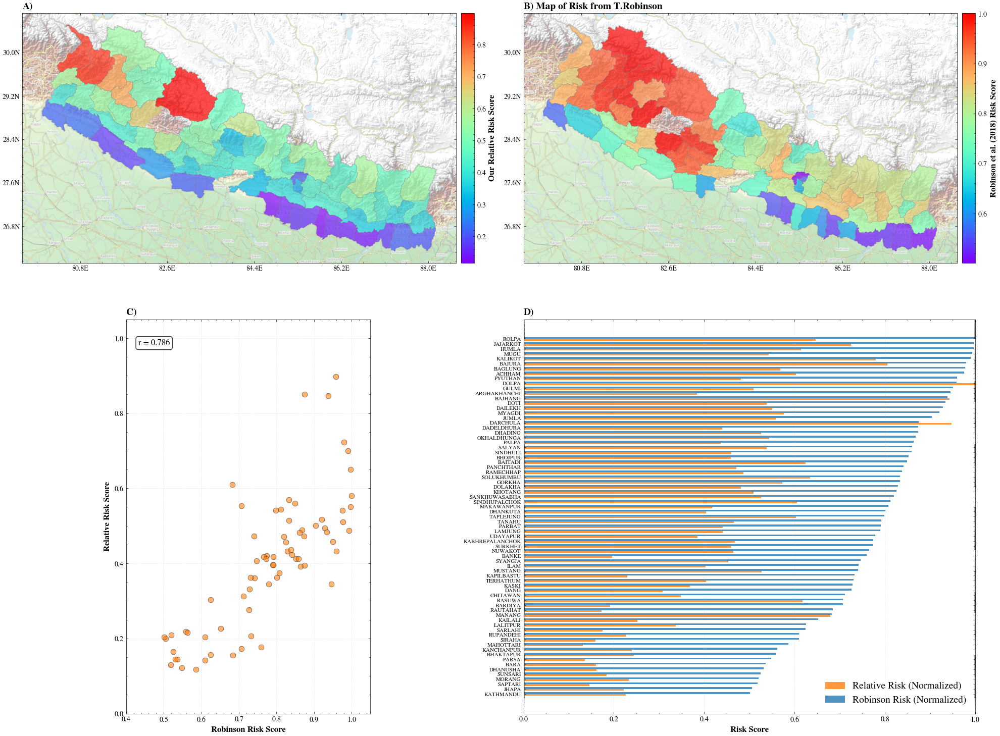

In [45]:
print("Creating Figure S5: Robinson Risk Score Comparison (New 2x2 Layout)...")

# Filter to matched districts with complete data
plot_data = nepal_admin_comparison[
    nepal_admin_comparison['Robinson_Risk_Score'].notna() &
    nepal_admin_comparison['RiskScore_Normalized'].notna()
].copy()

print(f"✓ Plotting {len(plot_data)} districts with complete data")

# Create figure with 2x2 subplots
fig_rob, axes_rob = plt.subplots(2, 2, figsize=(20, 16))

# Convert to Web Mercator for contextily
plot_data_mercator = plot_data.to_crs("EPSG:3857")

# Helper for coordinate formatting
def format_lon(x, pos):
    lon = x / 20037508.34 * 180
    return f'{lon:.1f}E'

def format_lat(y, pos):
    lat = (2 * np.arctan(np.exp(y / 20037508.34 * 180 * np.pi / 180)) - np.pi / 2) * 180 / np.pi
    return f'{lat:.1f}N'

# =============================================================================
# PANEL A (Top Left): Map of Relative Risk (Our Normalized)
# =============================================================================
ax_a = axes_rob[0, 0]

vmin_a = np.min(plot_data_mercator['RiskScore_Normalized'])
vmax_a = np.max(plot_data_mercator['RiskScore_Normalized'])

plot_data_mercator.plot(
    column='RiskScore_Normalized',
    ax=ax_a,
    cmap='rainbow',
    vmin=vmin_a,
    vmax=vmax_a,
    edgecolor='gray',
    linewidth=0.3,
    alpha=0.7,
    legend=False
)

try:
    import contextily as ctx
    ctx.add_basemap(ax_a, crs=plot_data_mercator.crs,
                   source=ctx.providers.OpenTopoMap,
                   alpha=0.4, attribution=False, zoom=8)
except Exception as e:
    print(f"Could not add basemap to Panel A: {e}")
    ax_a.set_facecolor('lightgray')

# Colorbar for A
divider_a = make_axes_locatable(ax_a)
cax_a = divider_a.append_axes("right", size="3%", pad=0.1)
norm_a = colors.Normalize(vmin=vmin_a, vmax=vmax_a)
sm_a = plt.cm.ScalarMappable(cmap='rainbow', norm=norm_a)
sm_a.set_array([])
cbar_a = plt.colorbar(sm_a, cax=cax_a)
cbar_a.set_label('Our Relative Risk Score', fontsize=12, fontweight='bold')

ax_a.xaxis.set_major_formatter(ticker.FuncFormatter(format_lon))
ax_a.yaxis.set_major_formatter(ticker.FuncFormatter(format_lat))
ax_a.tick_params(axis='both', labelsize=10)
ax_a.set_title('A)', fontsize=14, fontweight='bold', loc='left')

# =============================================================================
# PANEL B (Top Right): Map of Robinson Risk
# =============================================================================
ax_b = axes_rob[0, 1]

vmin_b = np.min(plot_data_mercator['Robinson_Risk_Score'])
vmax_b = np.max(plot_data_mercator['Robinson_Risk_Score'])

plot_data_mercator.plot(
    column='Robinson_Risk_Score',
    ax=ax_b,
    cmap='rainbow',
    vmin=vmin_b,
    vmax=vmax_b,
    edgecolor='gray',
    linewidth=0.3,
    alpha=0.7,
    legend=False
)

try:
    ctx.add_basemap(ax_b, crs=plot_data_mercator.crs,
                   source=ctx.providers.OpenTopoMap,
                   alpha=0.4, attribution=False, zoom=8)
except:
    ax_b.set_facecolor('lightgray')

# Colorbar for B
divider_b = make_axes_locatable(ax_b)
cax_b = divider_b.append_axes("right", size="3%", pad=0.1)
norm_b = colors.Normalize(vmin=vmin_b, vmax=vmax_b)
sm_b = plt.cm.ScalarMappable(cmap='rainbow', norm=norm_b)
sm_b.set_array([])
cbar_b = plt.colorbar(sm_b, cax=cax_b)
cbar_b.set_label('Robinson et al. (2018) Risk Score', fontsize=12, fontweight='bold')

ax_b.xaxis.set_major_formatter(ticker.FuncFormatter(format_lon))
ax_b.yaxis.set_major_formatter(ticker.FuncFormatter(format_lat))
ax_b.tick_params(axis='both', labelsize=10)
ax_b.set_title('B) Map of Risk from T.Robinson', fontsize=14, fontweight='bold', loc='left')

# =============================================================================
# PANEL C (Bottom Left): Scatter Plot
# =============================================================================
ax_c = axes_rob[1, 0]

ax_c.scatter(plot_data['Robinson_Risk_Score'], plot_data['RiskScore_Normalized'],
            s=60, alpha=0.6, color='#ff7f0e', label='Districts',
            marker='o', edgecolors='black', linewidth=0.5)

# 1:1 line
# ax_c.plot([0, 1], [0, 1], 'k--', linewidth=1.5, alpha=0.5, label='1:1 line')

# Correlation
from scipy.stats import pearsonr
corr, _ = pearsonr(plot_data['Robinson_Risk_Score'], plot_data['RiskScore_Normalized'])
ax_c.text(0.05, 0.95, f'r = {corr:.3f}', transform=ax_c.transAxes,
         fontsize=12, verticalalignment='top',
         bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

ax_c.set_xlabel('Robinson Risk Score', fontsize=12, fontweight='bold')
ax_c.set_ylabel('Relative Risk Score', fontsize=12, fontweight='bold')
ax_c.set_title('C)', fontsize=14, fontweight='bold', loc='left')
ax_c.grid(True, alpha=0.3, linestyle='--')
ax_c.set_xlim(0.4, 1.05)
ax_c.set_ylim(0.0, 1.05)
ax_c.set_aspect('equal')

# =============================================================================
# PANEL D (Bottom Right): Bar Plot (Sorted by Robinson)
# =============================================================================
ax_d = axes_rob[1, 1]

top_n = 80
# Sort by Robinson score for ranking
top_rob = plot_data.nlargest(top_n, 'Robinson_Risk_Score').sort_values('Robinson_Risk_Score', ascending=True)

y = np.arange(len(top_rob))
height = 0.35

# Plot bars
# Normalize both scores to max=1 for fair comparison
ax_d.barh(y - height/2, top_rob['RiskScore_Normalized'] / top_rob['RiskScore_Normalized'].max(), height,
         label='Relative Risk (Normalized)', color='#ff7f0e', alpha=0.8)
ax_d.barh(y + height/2, top_rob['Robinson_Risk_Score'] / top_rob['Robinson_Risk_Score'].max(), height,
         label='Robinson Risk (Normalized)', color='#1f77b4', alpha=0.8)

ax_d.set_yticks(y)
ax_d.set_yticklabels(top_rob['DISTRICT'], fontsize=8)
ax_d.set_xlabel('Risk Score', fontsize=12, fontweight='bold')
ax_d.set_title('D)', fontsize=14, fontweight='bold', loc='left')
ax_d.legend(loc='lower right', fontsize=14)
ax_d.grid(axis='x', alpha=0.3, linestyle='--')
ax_d.set_xlim(0, 1.0)

# =============================================================================
# SAVE FIGURE
# =============================================================================
plt.tight_layout()

output_file_png = os.path.join(output_dir, 'FigS5_robinson_comparison.png')

plt.savefig(output_file_png, dpi=300, bbox_inches='tight')

print(f"\n✓ Saved ranked bar plot comparison:")
print(f"  PNG: {output_file_png}")

plt.show()


---
# END OF NOTEBOOK
---